# Portfolio optimization: mean-variance theory

In [1]:
import numpy as np
import pandas as pd

from matplotlib.ticker import FuncFormatter
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline

from datetime import datetime
from numpy.random import multivariate_normal
import yfinance as yf

import scipy.stats as scs
import scipy.optimize as sco
import scipy.interpolate as sci

import seaborn as sns

import statsmodels.api as sm
from statsmodels.tsa.stattools import coint, adfuller

from sklearn.decomposition import KernelPCA

import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:85% !important; }</style>"))

import functions as f

In 1952, Harry Markowitz proposed a normative model on selection of risky assets. The basic assumption was that inversors care  about the "return" and "risk: of their portfolios. His great contribution was to define "return" as the mean of the probability distribution of assets returns and risk as the variance of that distribution.

By defining risk as variance, Markowitz was able to quantify precisely the gains of diversification: through diversification, risk can be reduced (though not eliminated) without changing the expected portfolio return.


## Basic theory

### The expected return on a portfolio

The return of a risky asset j will be defined as

$$ R_{j,t,s} = \dfrac{P_{j,t,s} - P_{j,t-1}}{P_{j,t-1}}$$

Where P denotes the price of the asset, t-1 is the date in which the asset is bought, t is the date in which the asset is sold and s denote the state of nature.

For simplicity, we will asume that the return's distribution is discrete and $\pi_s$ is the probability  . Thus, its expectation equals:

$$E(R_{jt}) = \sum_{s = 1}^S \pi_s R_{jts}$$

Consider a portfolio consisting of N assets, and let $\omega_j$ be the weight of each asset in the cost of the portfolio, then the return of this portfolio is:

$$R_{p,t,s}  = \sum_{j=1}^N \omega_j R_{j,t,s}$$

That is, the return on a portfolio is a weithed average of the returns of the assets in the portfolio.

The portfolio's expected return is also the weigthed average of the asset expected returns:

$$E(R_p) = \sum_{j=1}^N\omega_jE(R_j)$$


### Measurement of risk and diversification

The variance of an asset return equals:

$$\sigma_j^2 = E [R_j - E(R_j)]^2 = \sum_{s=1}^S \pi_s [R_j - E(R_j)]^2$$

In order to understand how can a portfoolio reduce its risk through diversification, let's asume we only have two assets. The variance of this two-assets portfolio is:

$$ \sigma^2_p = \omega^2\sigma_1^2 + (1 - \omega)^2\sigma_2^2 + 2 \omega(1 - \omega)\sigma_{12}$$

$$ \sigma^2_p = \omega^2\sigma_1^2 + (1 - \omega)^2\sigma_2^2 + 2 \omega(1 - \omega)\rho_{12}\sigma_1\sigma_2$$

Note that the variance of the portfolio depends on the correlation between the assets. We will explore how different correlations have a different impact on the variance of the portfolio and therefore in diversification gains.


The entire model is described by mean and variance of the assets. Therefore we are necessarily assuming that no other statistics are necessary to describe the distribution of end-of-period wealth. 
Since normal distribution is determined by mean and variance, if returns are normal distributed then we can fully describe the investment opportunity set. We will need to verify this condition and in case it doesn't hold we will have to assume so.

We define the **invesment opportunity set** as the pairs of mean and standar deviarion that can be achived by inversing arbitrary amounts in the N risky assets. The **frontier** of the invesment opportunity set is defined as the set of portfolios with minimum variance among all portfolios with equal expected returns.


### Sharpe ratio

In order to be capable to compare between different investment choices, we need a risk-adjusted return measure. Sharpe ratio is defined as the excess portfolio return over the risk-free rate relative to its standard deviation:

$$ S = \dfrac{E(R_p) - R_f}{\sigma_p}$$

where $R_f$ is the risk free rate of the market.

### Different correlations

Supose we have 2 normaly distributed assets.  We want to explore how different correlation can generate different results in terms of diversification gains.

Recall the variance of the portfolio is


$$ \sigma^2_p = \omega^2\sigma_1^2 + (1 - \omega)^2\sigma_2^2 + 2 \omega(1 - \omega)\rho_{12}\sigma_1\sigma_2$$

Let's asume for simplicity that both assets have the same variance. Then,

$$ \sigma^2_p = \left[1 - 2\omega(1 - \omega)(1 - \rho_{12})\right]\sigma^2$$

This allows as to visualize the reduction of the portfolio variance compared to the variance of the assets, i.e. diversification gains.



#### Case 1: Uncorrelated returns ($\rho =0$)

The maximum reduction in variance is achived when the inversment is equally split across securities ($\omega = 1/2$), which gives:

$$ \sigma^2_p = [1 - 2\omega(1 - \omega)]\sigma^2$$

$$\sigma^2_p = \left[1 - \dfrac{1}{2}\right]\sigma^2  = \dfrac{1}{2}\sigma^2$$

This means that by combining the two assets, variance can be reduced to half of individual variances. 
This makes very sense if we think of what a zero correlation means. Think for instance of tossing a coin twice, where the outcome of each toss is independent of the other. If instead of betting everything on a single toss we split out money into two toss, some losses will be offset by gains on the other gamble, but we may still lose on boths. Risk is reduced but not eliminated.

We will set the same variances for both assets and equal to 1. This will imply that $\rho_{1,2} = \dfrac{cov_{12}}{var_1 var_2} = cov_{12}$. Let's also assume that the assets means are 1 and 2.

In [2]:
def rand_weights(n):
    k = np.random.rand(n)
    return k / sum(k)

def portf_mean(w, mean):
    mu = w.dot(mean)
    return mu
    
def portf_var(w, cov_matrix):
    
    sigma = np.diagonal(w.dot(cov_matrix).dot(w.T))
    return sigma    

In [3]:
weights = np.zeros((500,2))
for i in range(len(weights)):
    weights[i] = f.rand_weights(2)

In [4]:
var1 = 1
var2 = 1
var= [var1, var2]
mean = [1,2]

In [5]:
def mean_var_plot(mean, var, corr):
    fig = plt.figure(figsize = (22,9))              
    plt.scatter(var, mean, marker='o',alpha = 0.8, label = 'Efficient part of the frontier')
    
    if corr == 1:
        for mu, sigma in zip(mean, var):
            if mu < max(mean):
                plt.scatter(sigma, mu, color = 'tomato')
        plt.scatter(x= var[np.argmax(mean)], y = max(mean), 
                    lw = 8, label = 'Minimum variance achieved',  marker= "X", c ='gold', s=70)

    else:
        for mu, sigma in zip(mean, var):
            if mu < mean[np.argmin(var)]:
                plt.scatter(sigma, mu, color = 'tomato')
        plt.scatter(x= min(var), y = mean[np.argmin(var)], marker= "X",
                   lw = 8, label = 'Minimum variance achieved', c ='gold', s=70)                
            
    plt.xlabel('Variance', fontsize = 15)
    plt.ylabel('Mean', fontsize = 15)
    plt.xlim(-0.01)
    plt.legend(loc='lower left', fontsize = 15)
    plt.title('Mean-variance frontiers for two asset with correlation '+ str(corr), fontsize = 17)
    plt.grid(True)
    
    return

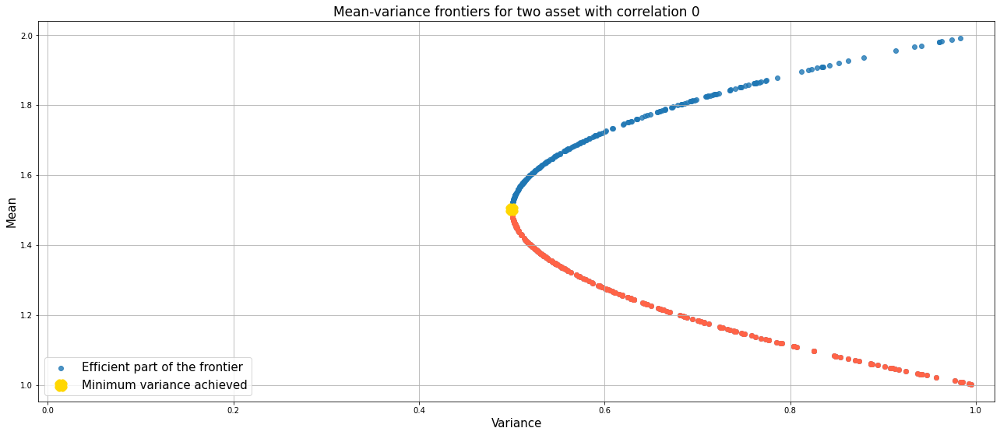

In [6]:
#Case 1
cov1 = 0
cov_matrix1 = np.asarray([[var1, cov1],
              [cov1, var2]])
case1 = multivariate_normal(mean, cov_matrix1, size = 100)
mean_p1= f.portf_mean(weights, mean)
var_p1 = f.portf_var(weights, cov_matrix1)

mean_var_plot(mean_p1, var_p1, corr = 0)

#### Case 2: Imperfectly positively correlated returns ($\rho =0.5$)

$$ \sigma^2_p = [1 - \omega(1 - \omega)]\sigma^2$$

Again, the maximum reduction in variance is achieved when the investment is equally split aross assets, but now:

$$ \sigma^2_p = \left[1 - \dfrac{1}{4}\right]\sigma^2 = \dfrac{3}{4}\sigma^2$$

Only a quarter of individual variance can be reduced. Losses are offset by gains but assets returns tend to move in the same direction, so such compensations across assets are less frequent.


In [100]:
#Case 2
cov2 = 0.5
cov_matrix2 = [[var1, cov2],
              [cov2, var2]]
case2 = multivariate_normal(mean, cov_matrix2, size = 100)
mean_p2= f.portf_mean(weights, mean)
var_p2 = f.portf_var(weights,cov_matrix2)

mean_var_plot(mean_p2, var_p2, corr = 0.5)

RuntimeError: Failed to process string with tex because latex could not be found

<Figure size 1584x648 with 1 Axes>

#### Case 3: Perfectly positively correlated returns ($\rho = 1$)

$$ \sigma^2_p = [1 - 2\omega(1 - \omega)(1-1)]\sigma^2 = \sigma^2$$

Since assets always move in the same direction, there is no diversification gains.


In [101]:
#Case 3
cov3 = 1
cov_matrix3 = [[var1, cov3],
              [cov3, var2]]
case3 = multivariate_normal(mean, cov_matrix3, size = 100)
mean_p3= f.portf_mean(weights, mean)
var_p3 = f.portf_var(weights, cov_matrix3)

mean_var_plot(mean_p3, var_p3, corr = 1)

RuntimeError: Failed to process string with tex because latex could not be found

<Figure size 1584x648 with 1 Axes>

#### Case 4: Imperfectly negatively correlated returns  ($\rho = -0.5$)

$$ \sigma^2_p = [1 - 3\omega(1 - \omega)]\sigma^2 $$

With $\omega = 1/2$:

$$ \sigma^2_p = \left[1 - \dfrac{3}{4}\right]\sigma^2 = \dfrac{1}{4}\sigma^2$$

Losses on one asset are offset by gains on the other. This happens more frequently than in the no correlation case, as asset returns tend to move in opposite directions.


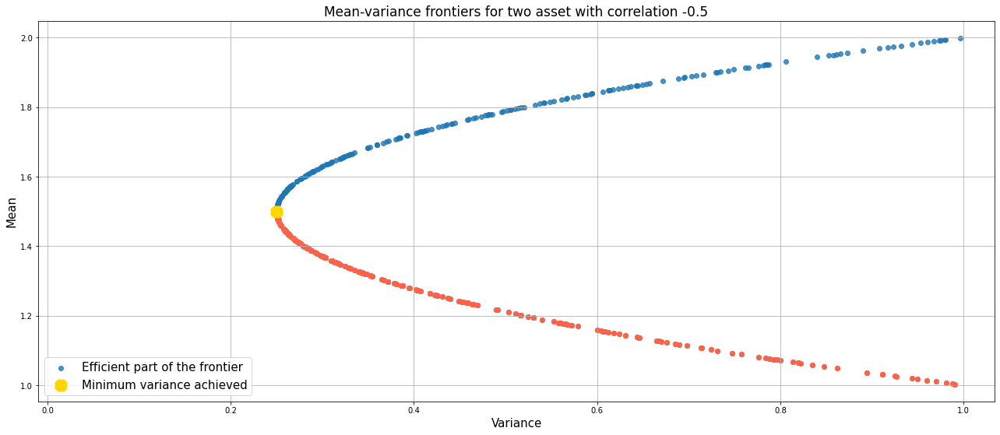

In [10]:
#Case 4
cov4 = -0.5
cov_matrix4 = [[var1, cov4],
              [cov4, var2]]
case4 = multivariate_normal(mean, cov_matrix4, size = 100)
mean_p4= f.portf_mean(weights, mean)
var_p4 = f.portf_var(weights, cov_matrix4)

mean_var_plot(mean_p4, var_p4, corr = -0.5)

#### Case 5: Perfectly negatively correlated returns ($\rho = -1$)

$$ \sigma^2_p = [1 - 4\omega(1 - \omega)(1-1)]\sigma^2$$

Setting $\omega = 1/2$ we get:

$$ \sigma^2_p = \left[1 - \dfrac{4}{4}\right]\sigma^2 = 0 $$

In this case losses are always compensated with gains so we can completely eliminate variance. Instead of risk diversification, we are actually talking about *risk hedging*. 

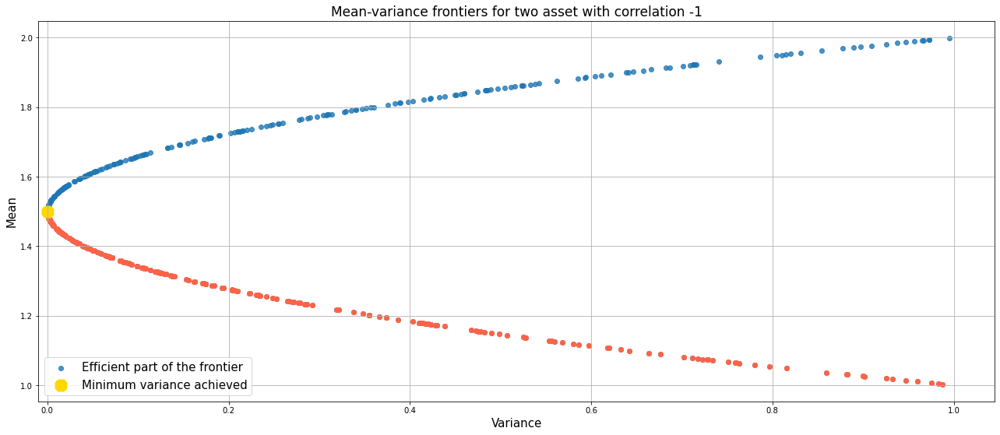

In [11]:
#Case 5
cov5 = -1
cov_matrix5 = [[var1, cov5],
              [cov5, var2]]
case5 = multivariate_normal(mean, cov_matrix5, size = 100)
mean_p5= f.portf_mean(weights, mean)
var_p5 = f.portf_var(weights, cov_matrix5)

mean_var_plot(mean_p5, var_p5, corr = -1)

Text(0.5, 1.0, 'Mean-variance frontiers for different correlations')

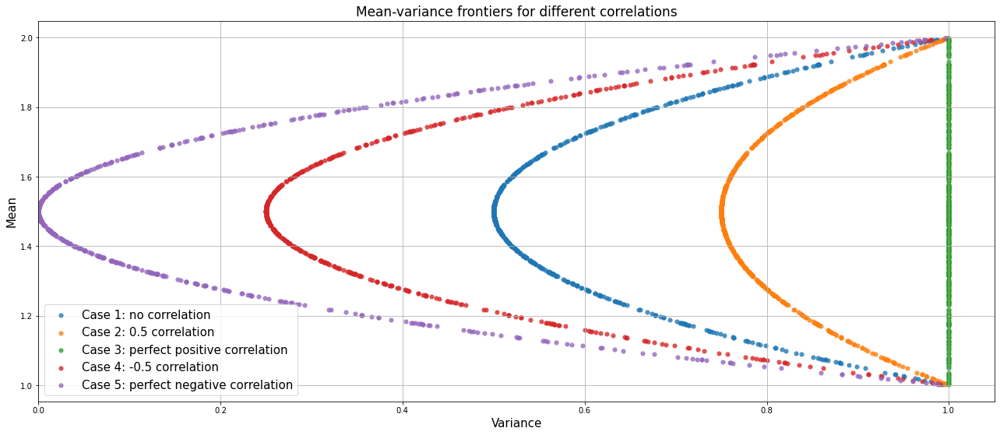

In [12]:
fig = plt.figure(figsize = (22,9))              
plt.scatter(var_p1, mean_p1, marker='o', lw = 0.1, alpha = 0.8, label = 'Case 1: no correlation')
plt.scatter(var_p2, mean_p2, marker='o', lw = 0.1, alpha = 0.8, label = 'Case 2: 0.5 correlation') 
plt.scatter(var_p3, mean_p3, marker='o', lw = 0.1, alpha = 0.8, label = 'Case 3: perfect positive correlation') 
plt.scatter(var_p4, mean_p4, marker='o', lw = 0.1, alpha = 0.8, label = 'Case 4: -0.5 correlation') 
plt.scatter(var_p5, mean_p5, marker='o', lw = 0.1, alpha = 0.8, label = 'Case 5: perfect negative correlation') 

plt.xlabel('Variance', fontsize = 15)
plt.ylabel('Mean', fontsize = 15)
plt.xlim(0)
plt.legend(loc='lower left', fontsize = 15)
plt.grid(True)
plt.title('Mean-variance frontiers for different correlations', fontsize = 17)

In [13]:
def returns_plot(cov):
    cov_matrix = np.asarray([[1, cov],
              [cov, 1]])
    mean = [0,0]
    case = multivariate_normal(mean, cov_matrix, size = 1000)
    
    fig = plt.figure(figsize = (10,7))
    
    plt.scatter(x=case[:,0], y=case[:,1])
    plt.xlabel('Asset 1 returns')
    plt.ylabel('Asset 2 returns')
    plt.title('Scatter plot of assets returns with correlation '+ str(cov))
    plt.xlim(-4,4)
    plt.grid(True)
    
    return 

Correlation: 0.6


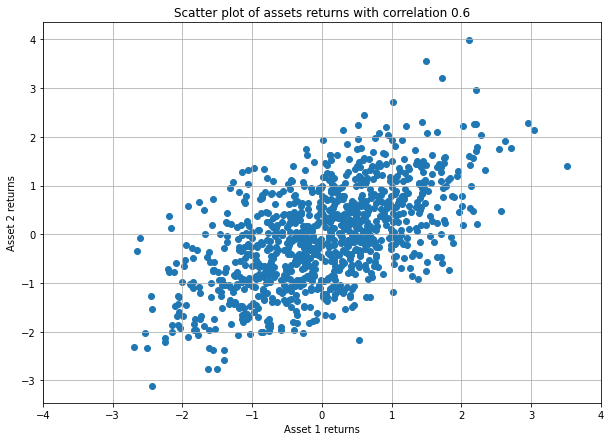

In [23]:
cor = float(input("Correlation: "))
if cor> 1 or cor< -1:
    print('Error! Correlation must be between -1 and 1')
else:
    returns_plot(cor)
    

Let's now add a third asset.

In [24]:
weights = np.zeros((2000,3))
for i in range(len(weights)):
    weights[i] = f.rand_weights(3)

In [25]:
noa = 3
n_obs = 10000

return_vec = np.random.randn(noa, n_obs)

np.mean(return_vec, axis = 1)
np.cov(return_vec)

array([[ 1.00824889, -0.00113816,  0.00687625],
       [-0.00113816,  0.99733939, -0.00686727],
       [ 0.00687625, -0.00686727,  0.99342641]])

''

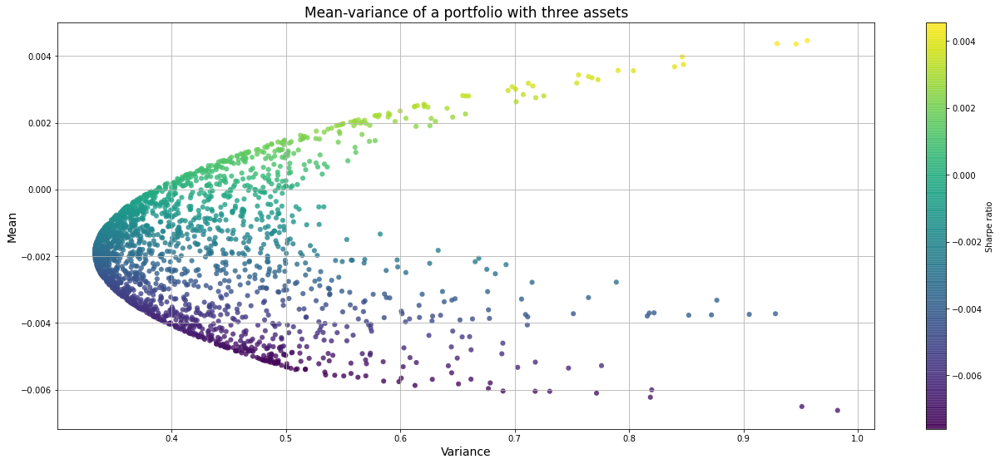

In [26]:
pmean= f.portf_mean(weights, np.mean(return_vec, axis = 1))
pvar = f.portf_var(weights, np.cov(return_vec))


fig = plt.figure(figsize = (22,9))          
plt.scatter(pvar, pmean, marker='o', lw = 0.1, alpha = 0.8, c = pmean/np.sqrt(pvar))
plt.grid(True)
plt.title('Mean-variance of a portfolio with three assets', fontsize = 17)
plt.xlabel('Variance', fontsize = 14)
plt.ylabel('Mean', fontsize = 14)
plt.colorbar(label = 'Sharpe ratio')
;

The graph above shows that when we invest in the three assets simultaneously, not only do we have access to mere combination of mean and variance, but also to better combinations. By adding a third asset to the portfolio, we profit from further diversification gains.

When calculating the Shapre ratio we assume $R_f = 0$

## Efficient frontier

*We will explain in detail the steps for finding the efficient frontier later.*

In [27]:
bnds = tuple((0, 1) for x in range(noa))

def min_func_port(w):
    return statistics(w)[1]

def statistics(weights):
    
    weights = np.array(weights) 
    pret = np.sum(np.mean(return_vec, axis = 1) * weights)
    pvol = np.dot(weights, np.dot(np.cov(return_vec), weights.T))
    
    return np.array([pret, pvol, pret / pvol])

trets = np.linspace(pmean.min(), pmean.max(), 100)
tvols = []

ef_we = []

for tret in trets:
    cons = ({'type': 'eq', 'fun': lambda x:  statistics(x)[0] - tret}, 
            {'type': 'eq', 'fun': lambda x:  np.sum(x) - 1})
    res = sco.minimize(min_func_port, [noa * [1. / noa,]], method='SLSQP',  
                       bounds=bnds, constraints=cons)
    tvols.append(res['fun'])
    ef_we.append(res['x'].round(3))
       
tvols = np.array(tvols)

ind = np.argmin(tvols)
tvols = tvols[ind:]
trets = trets[ind:]

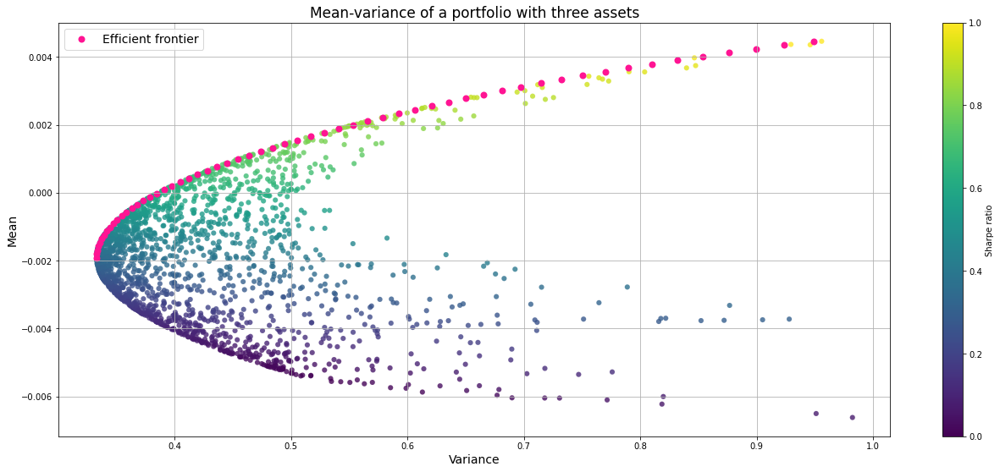

In [28]:
fig = plt.figure(figsize = (22,9))          
plt.scatter(pvar, pmean, marker='o', lw = 0.1, alpha = 0.8, c = pmean/np.sqrt(pvar))
plt.scatter(tvols, trets, c = 'deeppink', marker='o', label='Efficient frontier', lw = 2)
x = np.linspace(0.0, 5)

plt.grid(True)
plt.title('Mean-variance of a portfolio with three assets', fontsize = 17)
plt.xlabel('Variance', fontsize = 14)
plt.ylabel('Mean', fontsize = 14)
plt.colorbar(label = 'Sharpe ratio')
plt.legend(loc='best', fontsize = 14)

## Real data

In [2]:
tickers_funds =['IAU','TLH','LQD','HYG','^GSPC','EFA','EEM','VNQ','DX-Y.NYB','EURUSD=X']

data = pd.DataFrame(columns=tickers_funds)

for ticker in tickers_funds:
    data[ticker] = yf.download(ticker, period='10y')['Adj Close']
    
tickers_labels = ['Gold','iShares US Treas 10y-20y','iShares IG Corp',
                  'iShares HY Corp','S&P 500','iShares MSCI EAFE','iShares MSCI EM',
                  'Vanguard Real Estate Index', 'US Dollar/USDX - Index','EURUSD=X']

data.columns = tickers_labels
data = data.dropna()

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


In [9]:
data.head()

,Gold,iShares US Treas 10y-20y,iShares IG Corp,iShares HY Corp,S&P 500,iShares MSCI EAFE,iShares MSCI EM,Vanguard Real Estate Index,US Dollar/USDX - Index,EURUSD=X
Date,,,,,,,,,,
2010-10-18,13.44,97.151924,78.697136,50.521709,1184.709961,42.847408,37.963356,36.954472,76.930000,1.396433
2010-10-19,13.04,97.417137,78.704155,50.516075,1165.900024,41.903664,36.761257,36.498318,78.180000,1.393592
2010-10-20,13.14,97.513550,78.844498,50.673737,1178.170044,42.691349,37.346062,37.296577,77.169998,1.373909
2010-10-21,12.97,96.854584,78.634018,50.594936,1180.260010,42.460995,37.346062,37.256332,77.419998,1.396317
2010-10-22,12.98,96.926918,78.732231,50.825794,1183.079956,42.572453,37.386677,37.276436,77.470001,1.391692


Since time series start at rather different absolute value, we can show them in direct comparision by normalizing the, to a starting value of 100:

In [10]:
fig = px.line(data/ data.iloc[0] * 100)
fig.update_layout( title= "Last 10 years assets evolution",
            xaxis_title="Date",
            yaxis_title="Value",
            font=dict(
                family="Arial, monospace",
                size=12,
                color="black"
            ))
fig.show()

Let's now calculate log returns as   $ \log (P_t / P_{t-1})$ and analyse if they can be considered as normally distributed by observing their histograms and some other statistics, particularly Skewness and Kurtosis.

But first, let us introduce some statistical concepts.


### Random variables and probability functions

A **random variable** is a function that maps the outcomes of random phenomena to a unique numerical value.

The function that relates outcomes to their probabilities is called **probability density function (PDF)**

The **distribution function** shows the probability of receiving an outcome or  a lower one, that is, it shows the cumulative probabilities.

Let $X$ be a random variable, $q$ certain realization of that random variable, $f(x)$ the probability density function and $F(x)$ the distribution probability, then the probability that $X \leq q$ is:

$$ F(q) = \int_{-\infty}^{q}f(x)dx$$


#### Normal distribution
The normal distribution is the most commonly used distribution mainly beacuse is more convenient to work with than most other distributions, and it is completely described by the first and second moments.

$X$ is normally distributed if it has the density:

$$ f(x; \mu, \sigma) = \dfrac{1}{\sqrt{2\pi}\sigma} \exp \left[ - \dfrac{1}{2} \left( \dfrac{x - \mu}{\sigma}\right)^2\right]$$

and we write $X \sim N (\mu , \sigma^2)$

The normal distribution is unimiodal, symmetric and centered on $\mu$. The variance, $\sigma^2$, governs the dispertion of the distribution.

**Standard normal distribution**: Is the name given to the normal distribution with mean zero and unit variance, that is: $X \sim N (0,1) $

### Moments of a random variable

**Expectation**

The expectation of $X$, $\mu$, is the expected value or mean of the variable. It is defined by:

$$\mu = E(X) = \int_{-\infty}^{\infty}x f(x) dx$$

and it is estimated by the sample mean:

$$ \hat{\mu} = \hat{x} = \dfrac{1}{N}\sum_{i=1}^Nx_i$$


**Variance**

The variance of $X$ measures the spread of the variable around its mean. It is defined by:

$$\sigma^2 = E \left[ (X - \mu)^2\right] = \int_{-\infty}^{\infty}(x - \mu)^2 f(x) dx$$

If $\mu$ is known, we can compute the sample variance by:

$$\hat{\sigma}^2= \dfrac{1}{N}\sum_{i=1}^N (x_i - \mu)^2$$

In the more realistic case, in which $\mu$ is unknown we have to use the sample mean and adjust the formula in order to find the unbiased estimator for $\sigma^2$:

$$\hat{\sigma}^2= \dfrac{1}{N-1}\sum_{i=1}^N (x_i - \hat{\mu})^2$$


#### Higher order moments:

The mth moment of a random variable $X$ is defined by:
$$E(X^m)$$

and the mthe centered moment of a random variable is defined by:
$$E\left[ (X - \mu) ^m \right]$$.

Note that the first centered moment is the meand and the second centered moment is the variance.
*Skewness* and *Kurtosis* are functions of the third and fourth moments.


**Skewness**:
It is a measure of the asymmetry of the probability distribution of a random variable about its mean. In other words, skewness tells you the amount and direction of skew (departure from horizontal symmetry). The skewness value can be positive or negative, or even undefined. If skewness is 0, the data are perfectly symmetrical, although it is quite unlikely for real-world data. As a general rule of thumb:

 - If skewness is less than -1 or greater than 1, the distribution is highly skewed.
 - If skewness is between -1 and -0.5 or between 0.5 and 1, the distribution is moderately skewed.
 - If skewness is between -0.5 and 0.5, the distribution is approximately symmetric.

**Kurtosis**: 
This statistic tells you the height and sharpness of the central peak, relative to that of a standard bell curve.

 - If the kurtosis is 3, the distribution is normal.
 - If the kurtosis is less than 3, the distribution is platykurtic.
 - If the kurtosis is greater than 3, the distribution is leptokurtic.

In [3]:
log_returns = np.log(data / data.shift(1))
log_returns = np.round(log_returns.dropna(),4)
log_returns

,Gold,iShares US Treas 10y-20y,iShares IG Corp,iShares HY Corp,S&P 500,iShares MSCI EAFE,iShares MSCI EM,Vanguard Real Estate Index,US Dollar/USDX - Index,EURUSD=X
Date,,,,,,,,,,
2010-10-19,-0.0302,0.0027,0.0001,-0.0001,-0.0160,-0.0223,-0.0322,-0.0124,0.0161,-0.0020
2010-10-20,0.0076,0.0010,0.0018,0.0031,0.0105,0.0186,0.0158,0.0216,-0.0130,-0.0142
2010-10-21,-0.0130,-0.0068,-0.0027,-0.0016,0.0018,-0.0054,0.0000,-0.0011,0.0032,0.0162
2010-10-22,0.0008,0.0007,0.0012,0.0046,0.0024,0.0026,0.0011,0.0005,0.0006,-0.0033
2010-10-25,0.0100,0.0025,0.0036,0.0039,0.0021,0.0038,0.0108,0.0018,-0.0048,0.0020
...,...,...,...,...,...,...,...,...,...,...
2020-10-12,-0.0027,0.0026,0.0058,0.0050,0.0163,0.0058,0.0087,0.0047,0.0001,0.0042
2020-10-13,-0.0170,0.0052,-0.0010,-0.0045,-0.0063,-0.0113,-0.0041,-0.0173,0.0049,-0.0001
2020-10-14,0.0033,0.0015,0.0010,-0.0025,-0.0066,-0.0017,-0.0068,-0.0123,-0.0016,-0.0063


''

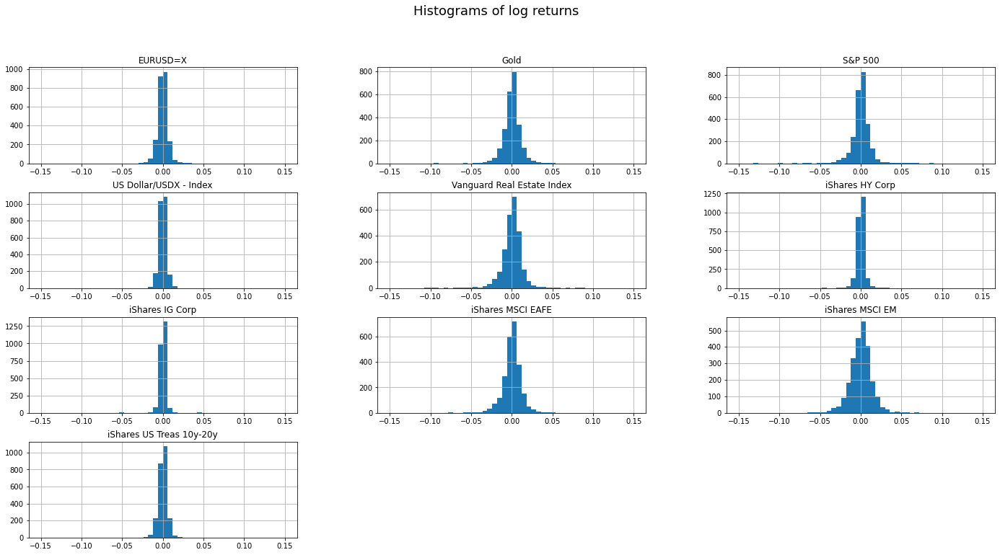

In [12]:
log_returns.hist(bins=50, figsize = (24,12), range = (-0.15, 0.15))

plt.suptitle("Histograms of log returns", fontsize= 18) 
;

In [33]:
for ticker in tickers_labels:
    print("\nResults for symbol %s" % ticker)
    print(30 * "-")
    log_data = np.array(log_returns[ticker])
    f.print_statistics(log_data)


Results for symbol Gold
------------------------------
     statistic           value
------------------------------
          size      2490.00000
           min        -0.09260
           max         0.04830
          mean         0.00012
           std         0.01001
          skew        -0.59293
      kurtosis         6.00971

Results for symbol iShares US Treas 10y-20y
------------------------------
     statistic           value
------------------------------
          size      2490.00000
           min        -0.05280
           max         0.04990
          mean         0.00022
           std         0.00570
          skew        -0.19504
      kurtosis        10.98756

Results for symbol iShares IG Corp
------------------------------
     statistic           value
------------------------------
          size      2490.00000
           min        -0.05130
           max         0.07130
          mean         0.00022
           std         0.00459
          skew         0.3

 The kurtosis values seem to be especially far from normal for all four data sets. We can also perform some normality tests.

In [34]:
for ticker in tickers_labels:
    print("\nResults for symbol %s" % ticker)
    print(30 * "-")
    log_data = np.array(log_returns[ticker])
    f.normality_test(log_data)


Results for symbol Gold
------------------------------
Skew of data set         -0.593
Skew test p-value          0.000
Kurt of data set          6.010
Kurt test p-value          0.000
Norm test p-value          0.000

Results for symbol iShares US Treas 10y-20y
------------------------------
Skew of data set         -0.195
Skew test p-value          0.000
Kurt of data set         10.988
Kurt test p-value          0.000
Norm test p-value          0.000

Results for symbol iShares IG Corp
------------------------------
Skew of data set          0.347
Skew test p-value          0.000
Kurt of data set         55.279
Kurt test p-value          0.000
Norm test p-value          0.000

Results for symbol iShares HY Corp
------------------------------
Skew of data set         -0.265
Skew test p-value          0.000
Kurt of data set         23.949
Kurt test p-value          0.000
Norm test p-value          0.000

Results for symbol S&P 500
------------------------------
Skew of data set       

 The above tests have normality as null hypothesis. Thus, normality is rejected for all of our data sets.

We can also study normality by generating normal random variables with mean and standard deviation equal to those of our sample data and comparing the theoretical distribution with the observed one.

Let's perform that excercise for the iShares HY Corp serie, which has a mean of 0.0002 and a standard deviation of 0.00546.

In [35]:
mu, sigma = 0.0002, 0.00546

HYCorp_normal = np.random.normal(mu, sigma, 2490)

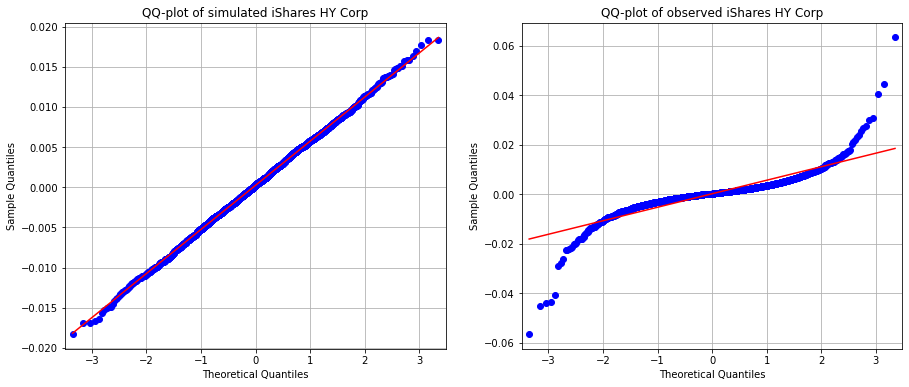

In [36]:
fig = plt.figure(figsize = (15,6))
ax = fig.add_subplot(1, 2, 1)

sm.qqplot(HYCorp_normal, line = 's', ax = ax)
plt.title('QQ-plot of simulated iShares HY Corp')
plt.grid(True)

ax = fig.add_subplot(1, 2, 2)
sm.qqplot(log_returns['iShares HY Corp'], line = 's', ax = ax)
plt.title('QQ-plot of observed iShares HY Corp')
plt.grid(True)

Text(0.5, 1.0, 'Histograms of simulated normal data and observed data')

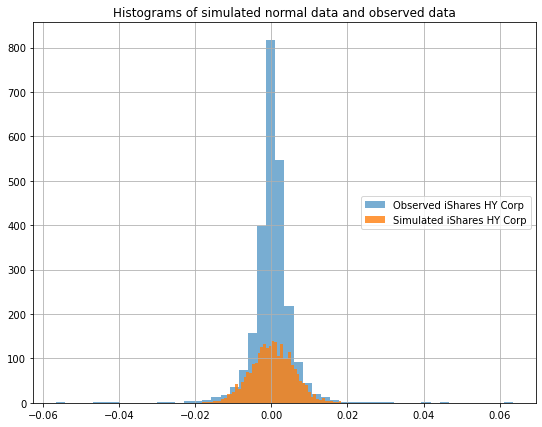

In [37]:
fig = plt.figure(figsize = (9,7))
plt.hist(log_returns['iShares HY Corp'], bins = 50,  label = 'Observed iShares HY Corp', alpha = 0.6)
plt.grid(True)
plt.hist(HYCorp_normal, bins = 50, label = 'Simulated iShares HY Corp', alpha = 0.8)
plt.grid(True)
plt.legend(loc = 'center right')
plt.title('Histograms of simulated normal data and observed data')

Even though normality does not hold, we will asume so in the rest of the analysis. Let's now generate the data we need.

In [38]:
noa = len(tickers_labels)
rets = np.log(data / data.shift(1)).dropna()
rets_mean= rets.mean() * 252
sigma = rets.cov() * 252

weights = f.rand_weights(noa)

In [39]:
weights = np.zeros((2000,noa))
for i in range(len(weights)):
    weights[i] = f.rand_weights(noa)
    
pret= f.portf_mean(weights, rets_mean)
pvol = np.sqrt(f.portf_var(weights, sigma))

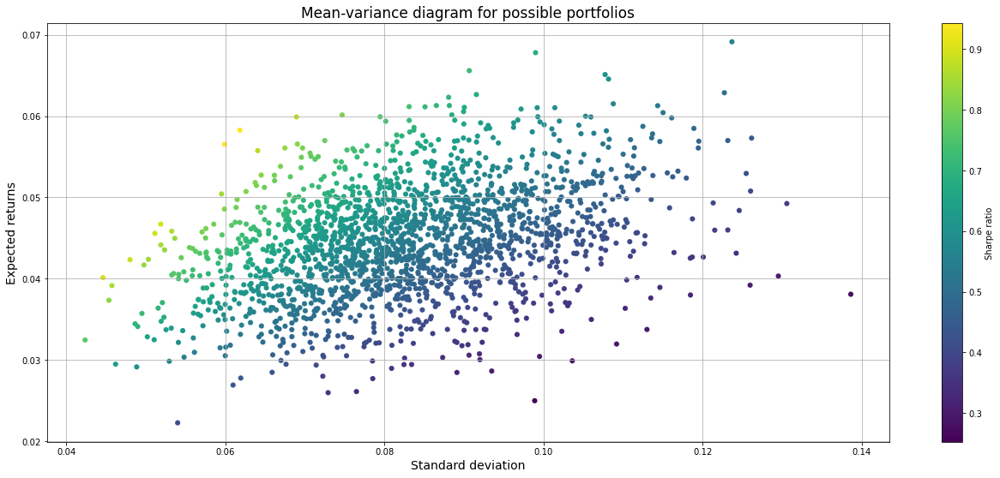

In [40]:
fig = plt.figure(figsize = (22,9))          
plt.scatter(pvol, pret, marker= 'o', lw = 0.1, c = pret/pvol)
plt.grid(True)
plt.title('Mean-variance diagram for possible portfolios', fontsize = 17)
plt.xlabel('Standard deviation', fontsize = 14)
plt.ylabel('Expected returns', fontsize = 14)
plt.colorbar(label = 'Sharpe ratio')

It is clear that not all weight distriburions perfom well when measured in terms of mean and variance. For example, for a fixed level of expected returns, say 0.04,  there are multiples portfolios that show different levels of risk. A rational investor would only be interested in the minimum risk given a fixed expected return, or the maximum return given a fixed risk level. This set of portfolios then makes up the so-called **efficient frontier**, which we will derive now.

## Portfolio Optimizations

To make our lives a bit easier, first we have a convenience function giving back the major portfolio statistics for an input weights vector/array.

The derivation of the optimal portfolios is a constrained optimization problem for which  we  use  the  function  minimize  from  the  scipy.optimize  sublibrary

In [41]:
def statistics(weights):
    
    weights = np.array(weights) 
    pret = np.sum(rets_mean * weights)
    pvol = np.sqrt(np.dot(weights.T, np.dot(sigma, weights)))
    
    return np.array([pret, pvol, pret / pvol])

The minimization function minimize is quite general and allows for (in)equality constraints and bounds for the parameters. Let us start with the maximization of the Sharpe ratio. Formally, we minimize the negative value of the Sharpe ratio:

In [42]:
def min_func_sharpe(weights):    
    return -statistics(weights)[2]

The constraint is that all parameters (weights) add up to 1. This can be formulated as follows using the conventions of the  minimize function

In [43]:
cons = ({'type': 'eq', 'fun': lambda x:  np.sum(x) - 1})

We also bound the parameter values (weights) to be within 0 and 1. These values are provided to the minimization function as a tuple of tuples in this case:

In [44]:
bnds = tuple((0, 1) for x in range(noa))

The only input that is missing for a call of the optimization function is a starting parameter list (initial guesses for the weights). We simply use an equal distribution.

Calling the function returns not only optimal parameter values, but much more. We store the results in an object we call opts.

In [45]:
opts = sco.minimize(min_func_sharpe, noa * [1. / noa], method='SLSQP',bounds=bnds, constraints=cons)
print(opts)

     fun: -1.3126308314800523
     jac: array([ 2.29534507e-03, -5.84766269e-04,  5.94024807e-02,  5.08859754e-04,
        3.12179327e-03,  9.40308660e-01,  2.12967889e+00,  1.28794621e+00,
       -1.80827081e-03,  3.33191082e-01])
 message: 'Optimization terminated successfully'
    nfev: 116
     nit: 10
    njev: 10
  status: 0
 success: True
       x: array([1.56724929e-02, 4.31844191e-01, 3.40651240e-15, 1.01689145e-01,
       1.98438634e-01, 0.00000000e+00, 2.39186180e-15, 7.29742601e-16,
       2.52355536e-01, 0.00000000e+00])


Our main interest lies in getting the optimal portfolio composition. To this end, we access the results object by providing the key of interest—i.e., x in our case. The optimization yields a portfolio that only consists of three out of the five assets:

In [46]:
print(tickers_labels)
opts['x'].round(3)

['Gold', 'iShares US Treas 10y-20y', 'iShares IG Corp', 'iShares HY Corp', 'S&P 500', 'iShares MSCI EAFE', 'iShares MSCI EM', 'Vanguard Real Estate Index', 'US Dollar/USDX - Index', 'EURUSD=X']


array([0.016, 0.432, 0.   , 0.102, 0.198, 0.   , 0.   , 0.   , 0.252,
       0.   ])

Using the portfolio weights from the optimization, the following statistics emerge:

In [47]:
statistics(opts['x']).round(3)

array([0.056, 0.043, 1.313])

Next, let us minimize the variance of the portfolio.

In [48]:
def min_func_variance(weights):    
    return statistics(weights)[1]**2

In [49]:
optv = sco.minimize(min_func_variance, noa * [1. / noa,],method='SLSQP', bounds=bnds,constraints=cons)
print(tickers_labels)
optv['x'].round(3)

['Gold', 'iShares US Treas 10y-20y', 'iShares IG Corp', 'iShares HY Corp', 'S&P 500', 'iShares MSCI EAFE', 'iShares MSCI EM', 'Vanguard Real Estate Index', 'US Dollar/USDX - Index', 'EURUSD=X']


array([0.066, 0.17 , 0.034, 0.133, 0.   , 0.062, 0.   , 0.   , 0.393,
       0.141])

We can further add two other possible portfolios: a risky one (Equity Mixed), and a more conservative one (Fixed Income Mixed)

In [50]:
print(tickers_labels)
w = np.array([0.00, 0.00, 0.00, 0.00, 0.34, 0.33, 0.33, 0.00, 0.00, 0.00])
w1 = np.array([0.00, 0.34, 0.33, 0.33, 0.00, 0.00, 0.00, 0.00, 0.00, 0.00])
print(np.sum(w))
print(np.sum(w1))

ms_prets = np.sum(rets.mean() * w) * 252
ms_prets1 = np.sum(rets.mean() * w1) * 252

ms_vols = np.sqrt(np.dot(w.T, np.dot(rets.cov() * 252, w)))
ms_vols1 = np.sqrt(np.dot(w1.T, np.dot(rets.cov() * 252, w1)))

['Gold', 'iShares US Treas 10y-20y', 'iShares IG Corp', 'iShares HY Corp', 'S&P 500', 'iShares MSCI EAFE', 'iShares MSCI EM', 'Vanguard Real Estate Index', 'US Dollar/USDX - Index', 'EURUSD=X']
1.0
1.0


## Efficient frontier

The derivation of all optimal portfolios—i.e., all portfolios with minimum volatility for a given target return level (or all portfolios with maximum return for a given risk level)
—is similar to the previous optimizations. The only difference is that we have to iterate over multiple starting conditions. The approach we take is that we fix a target return
level and derive for each such level those portfolio weights that lead to the minimum volatility value. For the optimization, this leads to two conditions: one for the target
return level  tret and one for the sum of the portfolio weights as before. The boundary values for each parameter stay the same.

For clarity, we define a dedicated function min_func for use in the minimization procedure. It merely returns the volatility value from the  statistics function.

In [51]:
con1 = {'type': 'eq', 'fun': lambda x:  statistics(x)[0] - tret}
con2 = {'type': 'eq', 'fun': lambda x:  np.sum(x) - 1}
bnds = tuple((0, 1) for x in range(noa))

def min_func_port(w):
    return statistics(w)[1]

In [52]:
trets = np.linspace(0.0025, 0.105, 100)
tvols = []

ef_we = []

for tret in trets:
    cons = ({'type': 'eq', 'fun': lambda x:  statistics(x)[0] - tret}, {'type': 'eq', 'fun': lambda x:  np.sum(x) - 1})
    res = sco.minimize(min_func_port, noa * [1. / noa,], method='SLSQP',  bounds=bnds, constraints=cons)
    tvols.append(res['fun'])
    ef_we.append(res['x'].round(3))
       
tvols = np.array(tvols)

ind = np.argmin(tvols)
tvols = tvols[ind:]
trets = trets[ind:]

In [53]:
ef_w = pd.DataFrame(ef_we,columns=tickers_labels)

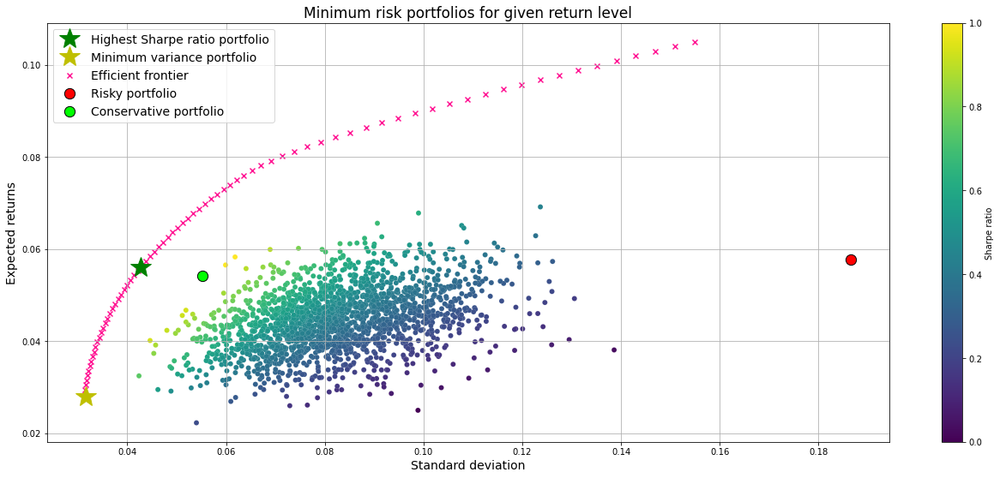

In [54]:
plt.figure(figsize=(22,9))

# random portfolio composition
plt.scatter(pvol, pret, marker= 'o', lw = 0.1, c = pret/pvol, edgecolors='w')

# efficient frontier
plt.scatter(tvols, trets, c = 'deeppink', marker='x', label='Efficient frontier', edgecolors='black')

# portfolio with highest Sharpe ratio

plt.plot(statistics(opts['x'])[1], statistics(opts['x'])[0],'g*', markersize=25.0, label='Highest Sharpe ratio portfolio')

# minimum variance portfolio
plt.plot(statistics(optv['x'])[1], statistics(optv['x'])[0],'y*', markersize=25.0, label='Minimum variance portfolio')


plt.scatter(ms_vols, ms_prets, c='red', s=150, marker='o',label='Risky portfolio', edgecolors='black')
plt.scatter(ms_vols1, ms_prets1, c='lime', s=150, marker='o',label='Conservative portfolio', edgecolors='black')

plt.grid(True)
plt.title('Minimum risk portfolios for given return level', fontsize = 17)
plt.xlabel('Standard deviation', fontsize = 14)
plt.ylabel('Expected returns', fontsize = 14)
plt.colorbar(label='Sharpe ratio')
plt.legend(fontsize=14, loc = 'best')

Note that the point cloud does not aproach much to the efficient frontier. That's because the optimal weights that generate the frontier are extreme weights, i.e. combination of only few assets. This is hardly randomly generated. Thus, we are gonna create those extreme weights in order to expand the point cloud.

In [55]:
def extreme_weights(noa):
    
    ew = f.rand_weights(noa)*np.random.randint(2, size=(noa))
    np.seterr(divide='ignore', invalid='ignore')
    return ew / sum(ew)

In [56]:
ex_weights = np.zeros((10000,noa))
for i in range(len(ex_weights)):
    ex_weights[i] = extreme_weights(noa)

In [57]:
new_weights = np.concatenate((weights, ex_weights, np.identity(noa), ef_we))

In [58]:
pret= f.portf_mean(new_weights, rets_mean)
pvol = np.sqrt(f.portf_var(new_weights, sigma))

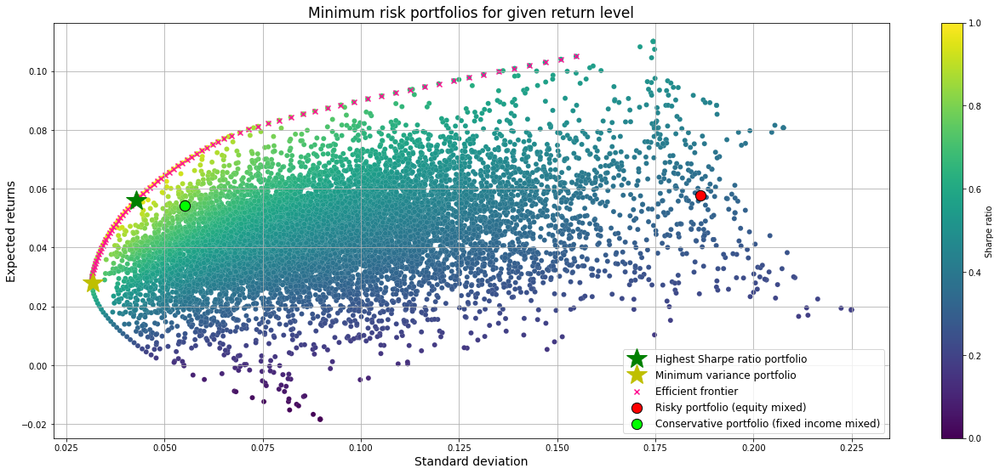

In [59]:
plt.figure(figsize=(22,9))

# random portfolio composition
plt.scatter(pvol, pret, marker= 'o', lw = 0.1, c = pret/pvol, edgecolors='w')

# efficient frontier
plt.scatter(tvols, trets, c = 'deeppink', marker='x', label='Efficient frontier', edgecolors='black')

# portfolio with highest Sharpe ratio

plt.plot(statistics(opts['x'])[1], statistics(opts['x'])[0],'g*', markersize=25.0, label='Highest Sharpe ratio portfolio')

# minimum variance portfolio
plt.plot(statistics(optv['x'])[1], statistics(optv['x'])[0],'y*', markersize=25.0, label='Minimum variance portfolio')


plt.scatter(ms_vols, ms_prets, c='red', s=150, marker='o',label='Risky portfolio (equity mixed)', edgecolors='black')
plt.scatter(ms_vols1, ms_prets1, c='lime', s=150, marker='o',label='Conservative portfolio (fixed income mixed)', edgecolors='black')

plt.grid(True)
plt.title('Minimum risk portfolios for given return level', fontsize = 17)
plt.xlabel('Standard deviation', fontsize = 14)
plt.ylabel('Expected returns', fontsize = 14)
plt.colorbar(label='Sharpe ratio')
plt.legend(fontsize=12, loc = 'lower right')

## Capital Market Line

In addition to risky securities like stocks or commodities (such as gold), there is in general one universal, riskless investment opportunity available: cash or cash accounts.
In an idealized world, money held in a cash account with a large bank can be considered riskless (e.g., through public deposit insurance schemes). The downside is that such a riskless investment generally yields only a small return, sometimes close to zero.

However, taking into account such a riskless asset enhances the efficient investment opportunity set for investors considerably. The basic idea is that investors first determine an efficient portfolio of risky assets and then add the riskless asset to the mix. By adjusting the proportion of the investor’s wealth to be invested in the riskless asset it is possible to achieve any risk-return profile that lies on the straight line (in the risk-return space) between the riskless asset and the efficient portfolio.

Let's now assume that the investors porfolio is formed with a proportion $p$ of risky assets which yields a return $R_x$ and $(1-p)$ of the riskless asset whose return $R_f$ is not a random variable. The new porfolio characteristics will then be:

$$ R_p = pR_x + (1 - p)R_f $$

$$ E(R_p) = p E(R_x) + (1-p)R_f = R_f + (E(R_x) - R_f)p$$

$$ \sigma^2_p = p^2\sigma^2_x$$

Thus the market line will be:

$$ E(R_p) = R_f +\dfrac{(E(R_x) -R_f)}{\sigma_p}\sigma_x$$
$$ E(R_p) = R_f +S_p \sigma_x$$

The investor may combine the risk-free asset with any portfolio of risky asset available, which gives rise to many straight lines in the mean-variance diagram. But among all the efficient portfolios, all investor will choose one that achieves the best mean-variance pair, that is the **tangency porfolio**. That portfolio is the one that maximizes the Sharpe Ratio.

In order to find the market line we need to carry a spline interpolation of the efficient frontier. The following code selects exactly these portfolios from our previously used sets tvols and trets.

In [60]:
ind = np.argmin(tvols)
evols = tvols[ind:]
erets = trets[ind:]

The new ndarray objects *evols* and *erets* are used for the interpolation:

In [61]:
tck = sci.splrep(evols, erets)

Via this numerical route we end up being able to define a continuos function f(x) for the efficient frontier:

In [62]:
def g(x):
    '''Efficient frontier function (splines approximation)'''
    return sci.splev(x, tck, der = 0)

In [63]:
Rf = 0.01

Sp = []
for sigma, mu in zip(evols, g(evols)):
     Sp.append((mu - Rf)/sigma)

In [64]:
sigma_T = np.linspace(0.0, 0.10)
E_T = Rf + max(Sp)*sigma_T

TP = np.argmax((g(evols)-Rf)/evols)

Text(0.5, 1.0, 'Capital market line and tangency portfolio')

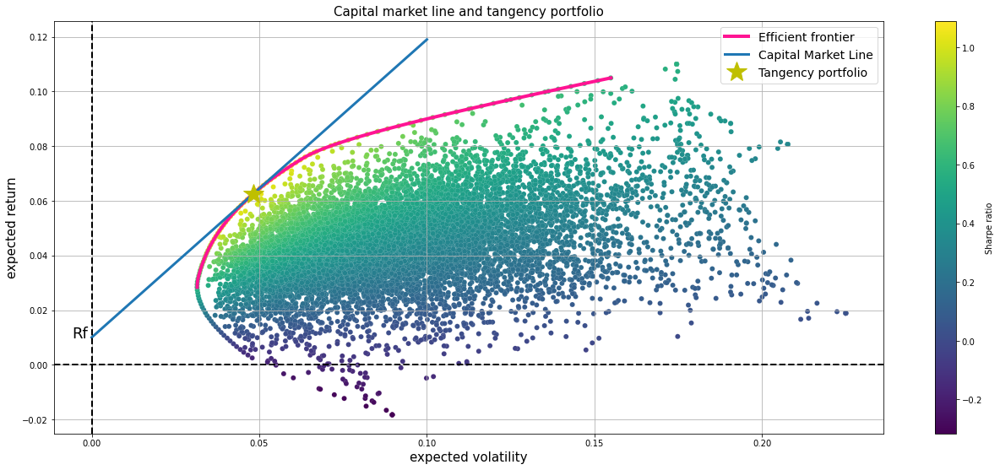

In [65]:
plt.figure(figsize=(22,9))

# random portfolio composition
plt.scatter(pvol, pret, marker= 'o', lw = 0.1, c = (pret-Rf)/pvol, edgecolors='w')

# efficient frontier
plt.plot(evols, erets, 'deeppink', lw=4, label='Efficient frontier')

# capital market line
plt.plot(sigma_T, E_T, lw = 3, label= 'Capital Market Line')

# tangency portfolio
plt.plot(evols[TP], erets[TP], 'y*', markersize=25.0, label='Tangency portfolio')

# risk free rate
plt.text(-0.006, Rf, 'Rf', fontsize = 18)

plt.grid(True)
plt.axhline(0, color='k', ls='--', lw=2.0)
plt.axvline(0, color='k', ls='--', lw=2.0)
plt.xlabel('expected volatility', fontsize = 15)
plt.ylabel('expected return', fontsize = 15)
plt.colorbar(label='Sharpe ratio')
plt.legend(fontsize=14)
plt.title('Capital market line and tangency portfolio', fontsize = 15)

The portfolio weights of the tangent portfolio are as follows. 

In [66]:
cons = ({'type': 'eq', 'fun': lambda x:  statistics(x)[0] - erets[TP]}, 
        {'type': 'eq', 'fun': lambda x:  np.sum(x) - 1})
res = sco.minimize(min_func_port, noa * [1. / noa,], method='SLSQP',bounds=bnds, constraints=cons)

In [67]:
keys = tickers_labels
values = res['x'].round(4)
res = {keys[i]: values[i] for i in range(len(keys))} 
res

{'Gold': 0.0778,
 'iShares US Treas 10y-20y': 0.1156,
 'iShares IG Corp': 0.1176,
 'iShares HY Corp': 0.112,
 'S&P 500': 0.2032,
 'iShares MSCI EAFE': 0.0969,
 'iShares MSCI EM': 0.0593,
 'Vanguard Real Estate Index': 0.1569,
 'US Dollar/USDX - Index': 0.0602,
 'EURUSD=X': 0.0005}

# Risk measures

Consider three different type of assets, all with the same volatility and mean, but different distributions (e.g.: normal, uniform, Student-t). Standard mean variance analysis indicates that all three assets are qeually risky and preferable because their means and volatilities are the same. However, in reality, market participants view the risk in them quite differently and are likely to have a preference for one of these assets. This suggests that some objective way to comparethe risk in assets with different distribution is desirable.

Volatility or standard deviation is the main measure of risk in most financial analysis, but it is sufficient as a risk measure only when returns are normally distributed. However, as discused before, the normality assumption is violeted for most if not all financial returns. 


## Value-at-risk (VaR)

The most common reask measure after volatility is value-at-risk (VaR). It is a single summary statistical measure of risk, it is distribution independent and it is a measure of losses as a result of "typical" market movements.
VaR has become one of the most widely used risk measures, and a much debated one. Loved by practitioners for its intuitive appeal, it is also discussed and criticized by many - mainly on theoretical grounds, with regard to its limited ability to capture what is called *tail risk*.

***Definition***: *The loss on a trading portfolio such that there is a probability $p$ of losses equaling or exceeding VaR in a given trading period and a $(1-p)$ probability of losses being lower than the VaR.*

We may write it as $VaR(p)$ or $VaR$ at $100 \times  p \%$ to make the dependence on probability explicit. The most common probability levels are 1% or 5%.

VaR is a quantile of the distribution of profit and loss (P&L). We indicate P&L on an investment portfolio by the random variable $Q$, with a particular realization indicated by $q$. The density of P/L is denoted by $f_q (.)$. Thus, VaR is given by:

$$P[Q \leq -VaR(p)]= p$$

or

$$p = \int_{-\infty}^{-VaR(p)}f_q(x)dx$$

We use a minus sign because VaR is a positive number and we are dealing with losses. You should then interpret it as *the probability of losses being larger than VaR*.

Consider a stock position, worth 1 million USD today, that has a $VaR(0.01)$ (or $VaR$ at $1\%$) of 50,000 USD over a time period of 30 days (one month). This VaR figure says that the loss to be expected over a period of 30 days can exceed 50,000 USD with probability 0.01. In other words, there is a probability of 0.99 that losses will not exceed that value. 
However, it does not say anything about the size of the loss once a loss beyond 50,000 USD occurs—i.e., if the maximum loss is 100,000 or 500,000 USD what the probability of such a specific “higher than VaR loss” is. That is what is called the tail risk.


### Historical distribution 

The issue here is: what is the probability distibution of P&L of a portfolio? The above discussion was based on the assumption that that distribution was known. Howerever, in practice, one needs to estimate the P&L distribution using historical observations of the asset returns of interest. This historical simulation is a simple method for forecasting risk and relies on the assumption that history repeats itself, where one of the observed past returns is expected to be the next period return.

Let's take some of the fund returns we calculated above and calcule the VaR. 
Suppose we invest 10,000 for 30 days. We are interested in the VaR of a financial position in the S&P 500 and the iShares US Treas 10y-20y fund for 30 days.

In [36]:
initial_investment = 10000
investment_horizon = 30
SP500 = log_returns['S&P 500']
US_treas= log_returns['iShares US Treas 10y-20y']

In [37]:
SP500=(((SP500+1).rolling(investment_horizon).apply(np.prod)-1)*initial_investment).dropna()
US_treas=(((US_treas+1).rolling(investment_horizon).apply(np.prod)-1)*initial_investment).dropna()

In [80]:
def plot_var(portfolio):
    fig = plt.figure(figsize = (18,7))
    mask1 = portfolio<scs.scoreatpercentile(portfolio, 5)
    mask2 = portfolio>scs.scoreatpercentile(portfolio, 5)
    plt.hist(portfolio[mask2], bins = 60)
    plt.hist(portfolio[mask1], bins = 40, color='red')
    plt.xlabel('P&L')
    plt.ylabel('Frequency')
    plt.axvline(scs.scoreatpercentile(portfolio, 5), color='r', linestyle='dashed', linewidth=2, 
                label = 'VaR at 5% ='+ str(round(scs.scoreatpercentile(portfolio, 5),2)))
    plt.text(scs.scoreatpercentile(portfolio, 5)- np.std(portfolio), 35, 
             'p = 0.05', fontsize = 12)
    plt.title('Distribution of '+ portfolio.name)
    plt.grid(True)
    plt.legend(loc='best')
    ;
    return

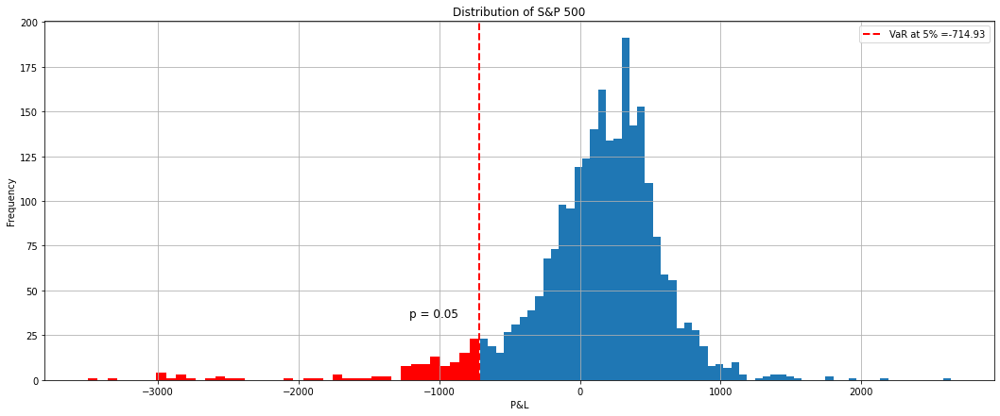

In [81]:
plot_var(SP500)

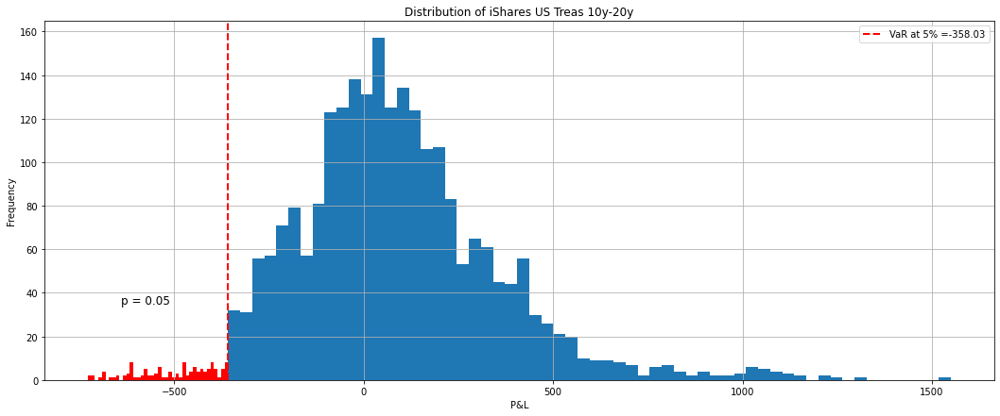

In [82]:
plot_var(US_treas)

In [83]:
def value_at_risk(portfolio):
    
    percs = [0.01, 0.1, 1., 2.5, 5.0, 10.0]
    VaR = scs.scoreatpercentile(portfolio, percs)
    print("%16s %16s" % ('Confidence Level', 'Value-at-Risk'))
    print(33 * "-")
    for pair in zip(percs, VaR):
        print("%11.2f %17.3f" % (100-pair[0], -pair[1]))
    return

In [84]:
value_at_risk(SP500)

Confidence Level    Value-at-Risk
---------------------------------
      99.99          3458.562
      99.90          3001.996
      99.00          1470.455
      97.50          1021.824
      95.00           714.932
      90.00           416.233


In [43]:
value_at_risk(US_treas)

Confidence Level    Value-at-Risk
---------------------------------
      99.99           726.102
      99.90           718.043
      99.00           608.110
      97.50           473.218
      95.00           358.035
      90.00           260.769


In [44]:
percs = list(np.arange(0.0, 10.1, 0.1))
SP500_var = scs.scoreatpercentile(SP500, percs)
US_treas_var = scs.scoreatpercentile(US_treas, percs)

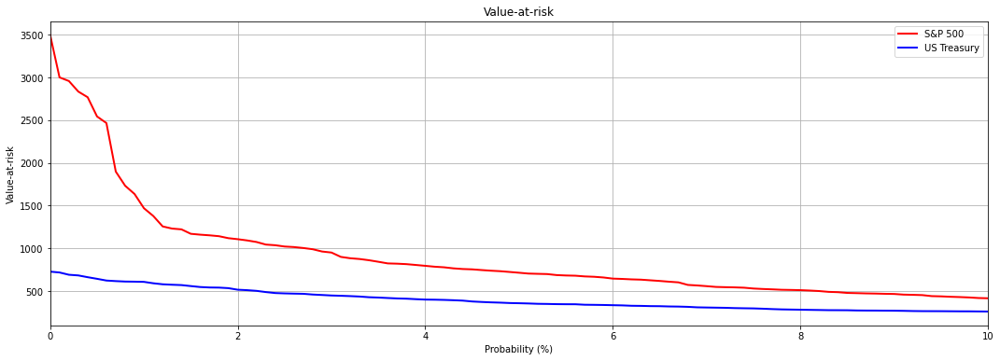

In [46]:
fig = plt.figure(figsize = (18,6))
plt.plot(percs, -SP500_var, lw=2, label='S&P 500', c='r')
plt.plot(percs, -US_treas_var, lw=2, label='US Treasury', c='b')
plt.legend(loc='best')
plt.xlabel('Probability (%)')
plt.ylabel('Value-at-risk')
plt.title('Value-at-risk')
plt.grid(True)
plt.autoscale(enable=True, axis='x', tight=True)

For each $p$, VaR of the S&P is always higher than VaR of US Treasuries.

### Monte Carlo simulations

Given the limitations of the above methods, a good replacement for VaR analysis is to perform Monte Carlo (MC) simulations.
The idea behind MC simulation is that we replicate market outcomes on the computer, based on some model of the evolution of the market. By doing a sufficient number of simulations, we get a large sample of market outcomes enabling us to calculate accurately some quantities of interests (VaR in this case). The main limitation of this approach is that it is always based on some model and the quality of the results in inevitably limited by the quality of the model.

For ilustration purpose, let's generate 3 different returns distributions and see how VaR behaves for each. The first two -standard normal and Student-t - are the most common one for replicating returns whereas the third one -uniform distributed- is an unusual case.

In [47]:
# Standard Normal
norm = np.random.standard_normal(10000)

# Student t
t = np.random.standard_t(5,10000)

#Uniform
unif = np.random.uniform(-1,1,10000)

NameError: name 'text' is not defined

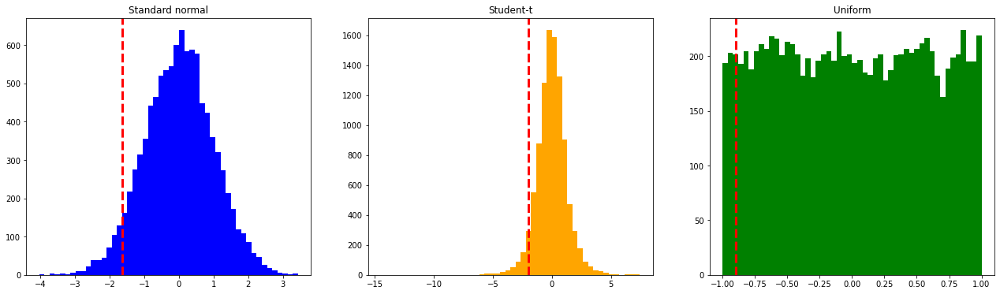

In [86]:
fig = plt.figure(figsize = (22,6))
plt.subplot(1,3,1)
plt.hist(norm, color = 'blue', bins = 50)
plt.title('Standard normal')
plt.axvline(scs.scoreatpercentile(norm, 5), color='r', linestyle='dashed', linewidth=3)

plt.subplot(1,3,2)
plt.hist(t, color = 'orange', bins = 50)
plt.title('Student-t')
plt.axvline(scs.scoreatpercentile(t, 5), color='r', linestyle='dashed', linewidth=3)

plt.subplot(1,3,3)
plt.hist(unif, color = 'green', bins = 50)
plt.title('Uniform')
plt.axvline(scs.scoreatpercentile(unif, 5), color='r', linestyle='dashed', linewidth=3)
text.usetex(True) 
;

Let's now generate daily returns of 3 assets to create a portfolio. 

We will asume Stundent-t distribution with different degrees of freedom (df). As the degrees of freedom increase, fewer extreme observations are obtained.
If df $\rightarrow \infty$, Student-t $\rightarrow$ Normal.
 
We will set equal weights for each asset.

In [49]:
rets1 = np.random.standard_t(5,10000)/100
rets2 = np.random.standard_t(50,10000)/100
rets3 = np.random.standard_t(100,10000)/100
rets = [rets1, rets2, rets3]

weights = [1/3, 1/3, 1/3]

In [50]:
port_rets = np.dot(weights, rets)
port_rets = pd.Series(port_rets, name ='simulated portfolio')

Let's again assume an initial investment of 10,000 and an investment horizon of 30 days.

In [51]:
initial_investment = 10000
investment_horizon = 30
port_rets =(((port_rets +1).rolling(investment_horizon).apply(np.prod)-1)*initial_investment).dropna()

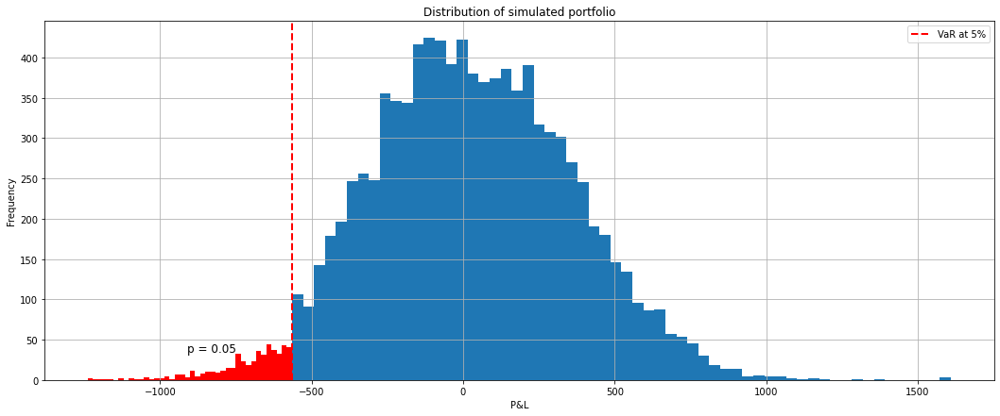

In [74]:
plot_var(port_rets)

In [53]:
value_at_risk(port_rets)

Confidence Level    Value-at-Risk
---------------------------------
      99.99          1237.912
      99.90          1083.341
      99.00           796.194
      97.50           674.268
      95.00           564.929
      90.00           422.397


## Expected shortfall

One of the flaws of the VaR aproach is that it is simply a quantile. In practice, the actual loss, if it occurs, can be grater than Var. In this sense, VaR may understimate the actual loss.
The most common alternative risk measure that tries to fill that gap is **expected shortfall** (ES), also known as tail VaR, conditional Value at Risk (CVaR), among others. ES answers the question: *what is expected loss when losses exceed VaR?*

*Definition*: Expected loss conditional on VaR being violated. $ES = -E[Q|Q\leq-VaR(p)]$

Let's define a function for ES and add it to our previous plots.

In [20]:
def ES(portfolio):
    var = scs.scoreatpercentile(portfolio, 5)
    shortfall = portfolio[portfolio<var]
        
    return shortfall.mean()

In [78]:
def plot_var_ES(portfolio):
    fig = plt.figure(figsize = (18,7))
    mask1 = portfolio<scs.scoreatpercentile(portfolio, 5)
    mask2 = portfolio>scs.scoreatpercentile(portfolio, 5)
    plt.hist(portfolio[mask2], bins = 60)
    plt.hist(portfolio[mask1], bins = 40, color='red')
    plt.xlabel('P&L')
    plt.ylabel('Frequency')
    plt.axvline(scs.scoreatpercentile(portfolio, 5), color='r', linestyle='dashed', linewidth=2, 
                label = 'VaR at 5% ='+ str(round(scs.scoreatpercentile(portfolio, 5),2)))
    plt.title('Distribution of '+ portfolio.name)
    plt.grid(True)
    plt.axvline(ES(portfolio), color='green', linestyle='dashed', linewidth=2, 
                label = 'Expected shortfall = '+str(round(ES(portfolio),2)))
    plt.legend(loc='best', fontsize = 13)
    ;
    return

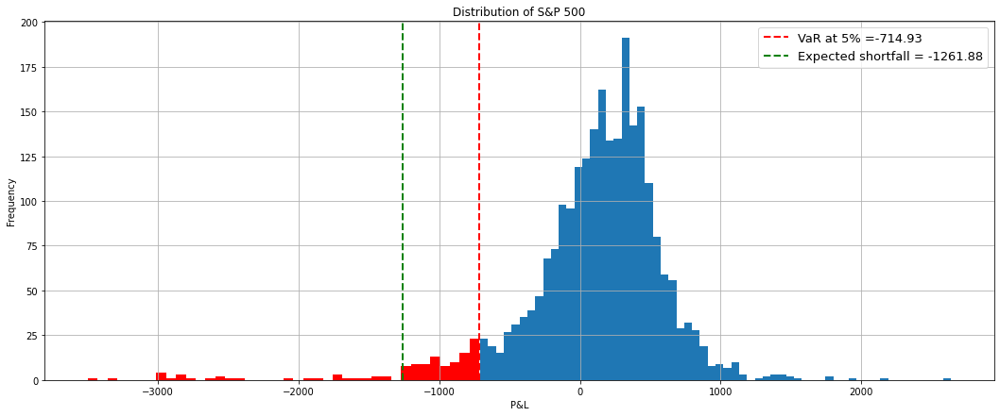

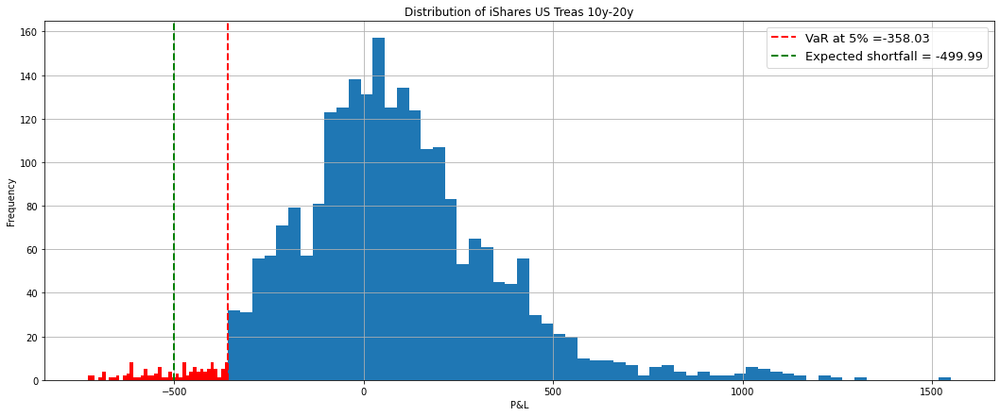

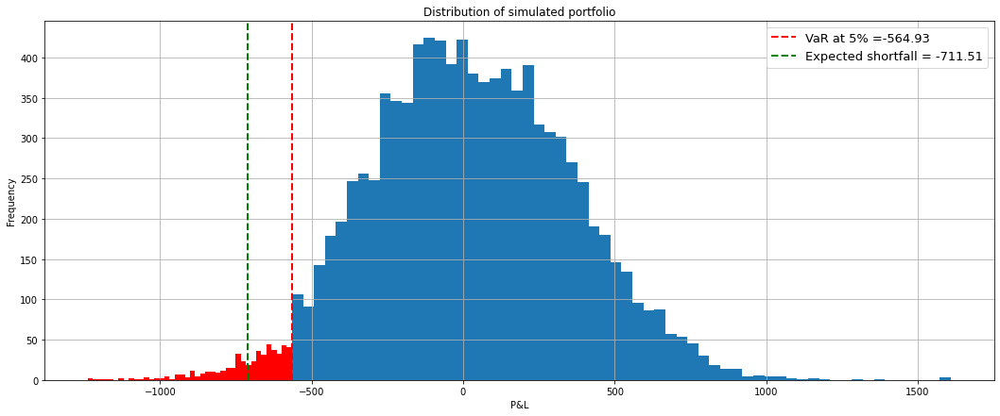

In [79]:
plot_var_ES(SP500)
plot_var_ES(US_treas)
plot_var_ES(port_rets)

# Market-neutral trading strategies

## 1. Long-Short Equity Strategies

Long-short equity refers to the fact that the strategy is both long and short in the equity market. This is a rather general statement, but has over time grown to mean a specific family of strategies. These strategies rank all stocks in the market using some model. The strategy then goes long (buys) the top $n$ equities of the ranking, and goes short on (sells) the bottom $n$ while maintaining equal dollar volume between the long and short positions. This has the advantage of being statistically robust, as by ranking stocks and entering hundreds or thousands of positions, you are making many bets on your ranking model rather than just a few risky bets. You are also betting purely on the quality of your ranking scheme, as the equal dollar volume long and short positions ensure that the strategy will remain market neutral (immune to market movements).


#### Ranking Scheme

A ranking scheme is any model that can assign each stock a number based on how they are expected to perform, where higher is better or worse. Examples could be value factors, technical indicators, pricing models, or a combination of all of the above. For example, you could use a momentum indicator to give a ranking to a basket of trend following stocks: stocks with highest momentum are expected to continue to do well and get the highest ranks; stocks with lowest momentum will perform the worst and get lowest rans.

The success of this strategy lies almost entirely in the ranking scheme used — the better your ranking scheme can separate high performing stocks from low performing stocks, better the returns of a long-short equity strategy. It automatically follows that developing a ranking scheme is nontrivial.

#### Making a Bet on the Ranking Scheme

Once we have determined a ranking scheme, we would obviously like to be able to profit from it. We do this by investing an equal amount of money into buying stocks at the top of the ranking, and selling stocks at the bottom. This ensures that the strategy will make money proportionally to the quality of the ranking only, and will be market neutral.

#### Long and Short Baskets

If you are ranking $m$ equities, have $d$ dollars to invest, and your total target number of positions to hold is $2n$ (where $m>2n$), then the long and short baskets are created as follows. 
If the stock at rank 1 is expected to perform the worst and stock at rank m is expected to perform the best:

- For each equity in positions $1, \dots, n$ in the ranking, sell $\frac{1}{2n} \times d $ dollars of that equity. 
- For each equity in spots $m - n, \dots, m$ in the ranking, buy $\frac{1}{2n} \times d$ dollars of that equity.

#### Friction Because of Prices

Because equity prices will not always divide $\frac{1}{2n} \times  d$ evenly, and equities must be bought in integer amounts, there will be some imprecision and the algorithm should get as close as it can to this number. Most algorithms will have access to some leverage during execution, so it is fine to buy slightly more than $\frac{1}{2n} \times  d$ dollars per equity. This does, however, cause some friction at low capital amounts. 

Consider a strategy running with $n=100000$ and $p=500$, we see that

$$\dfrac{n}{2p}=\dfrac{100000}{1000}=100$$

This will cause big problems for stocks with prices > 100 since you can’t buy fractional stock. This is alleviated by trading fewer equities or increasing the capital.


#### Returns Come From The Ranking Spread

The returns of a long-short equity strategy are dependent on how well the ranking spreads out the high and low returns. To see how this works, consider this hypothetical example.

Let's generate a random factor and let's make equity returns dependent on those factors.

In [44]:
factor_values = np.random.normal(0, 1, 10000)
equity_names = ['Equity ' + str(x) for x in range(10000)]

data = pd.DataFrame(factor_values, columns = ['Factor Value'],index = equity_names)

data.head(10)

,Factor Value
Equity 0,-0.574876
Equity 1,-1.549423
Equity 2,0.321578
Equity 3,0.178790
Equity 4,0.292475
Equity 5,-1.432324
Equity 6,-0.978824
Equity 7,0.205238
Equity 8,0.222816
Equity 9,-1.053067


In [45]:
future_returns = factor_values + np.random.normal(0, 1, 10000)

data['Returns']= future_returns
data.head(10)

,Factor Value,Returns
Equity 0,-0.574876,-0.598683
Equity 1,-1.549423,-2.399836
Equity 2,0.321578,1.305428
Equity 3,0.178790,-0.703396
Equity 4,0.292475,1.050397
Equity 5,-1.432324,-2.139000
Equity 6,-0.978824,0.264834
Equity 7,0.205238,0.031712
Equity 8,0.222816,1.285773
Equity 9,-1.053067,-0.881503


Now that we have factor values and returns, we can see what would happen if we ranked our equities based on factor values, and then entered the long and short positions.

''

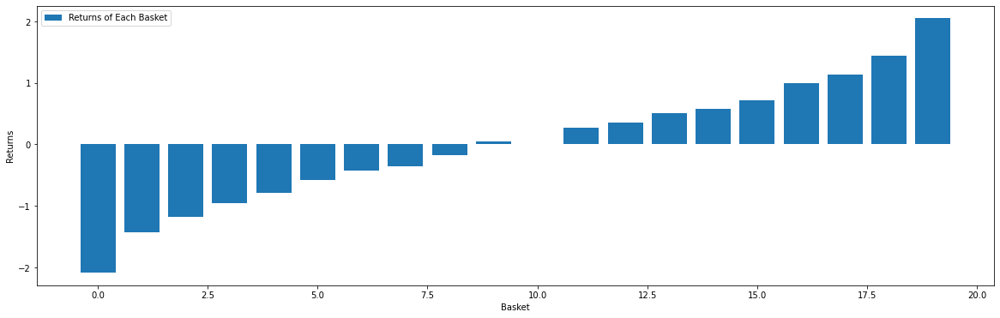

In [46]:
# Rank the equities
ranked_data = data.sort_values('Factor Value')

# Compute the returns of each basket
# Baskets of size 500, so we create an empty array of shape (10000/500)
number_of_baskets = int(10000/500)
basket_returns = np.zeros(number_of_baskets)

for i in range(number_of_baskets):
    start = i * 500
    end = i * 500 + 500 
    basket_returns[i] = ranked_data[start:end]['Returns'].mean()

# Plot the returns of each basket
fig = plt.figure(figsize = (20,6))
plt.bar(range(number_of_baskets), basket_returns)
plt.ylabel('Returns')
plt.xlabel('Basket')
plt.legend(['Returns of Each Basket'])

;

Let's compute the returns if we go long the top basket and short the bottom basket.

In [47]:
basket_returns[number_of_baskets-1] - basket_returns[0]

4.166509883464231

### Choice and Evaluation of a Ranking Scheme

The ranking scheme is where a long-short equity strategy gets its edge, and is the most crucial component. Choosing a good ranking scheme is the entire trick, and there is no easy answer. A good starting point is to pick existing known techniques, and see if you can modify them slightly to get increased returns. 

More ranking schemes  can be accomplished with Pricing Models, Technical Indicators, Fundamental Factors (Value based), etc.

## 2. Pairs trading

Pairs trading is one of the most popular types of trading strategy. The strategy incolves a pair of stocks are traded in a market-neutral strategy, i.e. it doesn’t matter whether the market is trending upwards or downwards, the two open positions for each stock hedge against each other. The election of the pair is based in some statistical concepts that we will introduce now.


## Integration, Cointegration, and Stationarity


### Stationarity

The foundation of time series analysis is stationarity. 

A time seties ${r_t}$ is said to be *strictly stationaty* if the joint distribution of $(R_{t_1}, \dots , R_{t_k})$ is identical to that of $(R_{t_{1+j}}, \dots , R_{t_{k+j}})$. In other words, strict stationarity requieres that the joint distribution $(R_{t_1}, \dots , R_{t_k})$ is invariant under time shift. Since this is a very strong condition and hardly verified, a weaker version is often assumed. 

A time series ${r_t}$ is *weakly invariant* if both the mean of $r_t$ and the covariance between $r_t$ and $r_{t-j}$ are time invariant, where j is an arbitrary integer. That is:
- $E(r_t) =\mu$, which is a constant
- $Cov(r_t, r_{t-j}) = \sigma_j$, which only depends on j.

Stationarity is so important because it enables one to make inference concerning futures observations.

To observe how stationary series behave, let's consider two series, A and B. Series A is generated from a stationary process with fixed parameters, series B is generated with parameters that change over time.

In [10]:
def generate_series(params):
    mu = params[0]
    sigma = params[1]
    return np.random.normal(mu, sigma)

''

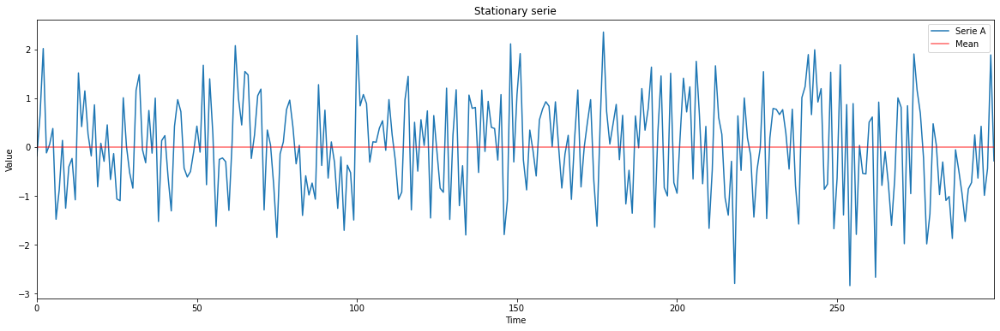

In [11]:
#SERIE A

params = (0, 1)
T = 300

A = np.zeros(T)
A = pd.Series(A, name ='A')
for t in range(T):
     A[t] = generate_series(params)


fig = plt.figure(figsize=(20,6))        
plt.plot(A, label = 'Serie A')
plt.axhline(A.mean(), color='red', alpha = 0.6, label = 'Mean')
plt.xlabel('Time')
plt.ylabel('Value')
plt.legend(loc='best')
plt.title('Stationary serie')
plt.autoscale(tight=True, axis='x')
;

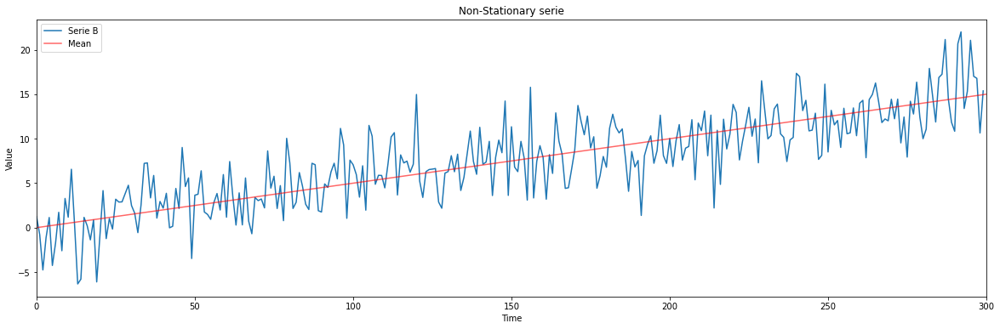

In [12]:
#SERIE B

T = 300
B = np.zeros(T)
B = pd.Series(B, name ='B')

for t in range(T):
    params = (t*0.05, 3)
    B[t] = generate_series(params)


fig = plt.figure(figsize=(20,6))        
plt.plot(B, label='Serie B')
plt.plot(np.linspace(0,T), np.linspace(0,T)*0.05, color='red', alpha = 0.6, label='Mean')
plt.xlabel('Time')
plt.ylabel('Value')
plt.legend(loc='best')
plt.title('Non-Stationary serie')
plt.autoscale(tight=True, axis='x');

**Why Non-Stationarity is dangerous?**  Many statistical tests require that the data being tested are stationary. Since most of them are based on the mean of the sample, it the serie is not stationary it won't be useful for any forecasting of future state. It's meaningless when compared with any specfic time, as it's a collection of different states at different times mashed together. 

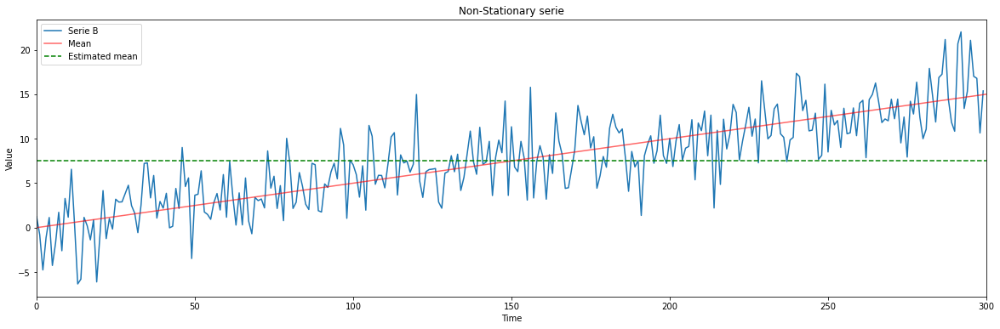

In [13]:
fig = plt.figure(figsize=(20,6))        
plt.plot(B, label='Serie B')
plt.plot(np.linspace(0,T), np.linspace(0,T)*0.05, color='red', alpha = 0.6, label='Mean')
plt.axhline(B.mean(), color = 'green', linestyle = 'dashed', label = 'Estimated mean')
plt.xlabel('Time')
plt.ylabel('Value')
plt.legend(loc='best')
plt.title('Non-Stationary serie')
plt.autoscale(tight=True, axis='x')

### Testing for Stationarity

The Augmented Dickey–Fuller test (ADF) tests the null hypothesis that a unit root is present in a time series sample, which means that the serie is nonstationary.

In [14]:
def check_for_stationarity(X, cutoff=0.01):
    
    pvalue = adfuller(X)[1]
    if pvalue < cutoff:
        print('p-value = ' + str(round(pvalue,4)) + ' The series ' + X.name +' is likely stationary.' )

    else:
        print ('p-value = ' + str(round(pvalue,4)) + ' The series ' + X.name +' is likely non-stationary.')
    
    return 

In [15]:
check_for_stationarity(A)
check_for_stationarity(B)

p-value = 0.0 The series A is likely stationary.
p-value = 0.7682 The series B is likely non-stationary.


A non-stationary serie is said to have a **unit root** or to be **integrated**. We will denote integration order-i as $I(i)$.

If a serie is $I(d)$ it has $d$ unit roots and yields a stationary process by taking repeated differences $d$ times. Similarly, to get a $I(d)$ serie, we can take an $I(0)$ series and iteratively take the cumulative sum $d$ times (which is the discrete way of integration).


### Real data

In [16]:
apple = yf.download('AAPL', period='5y')['Adj Close']
apple.name = 'AAPL'

[*********************100%***********************]  1 of 1 completed


In [17]:
check_for_stationarity(apple)

p-value = 0.9962 The series AAPL is likely non-stationary.


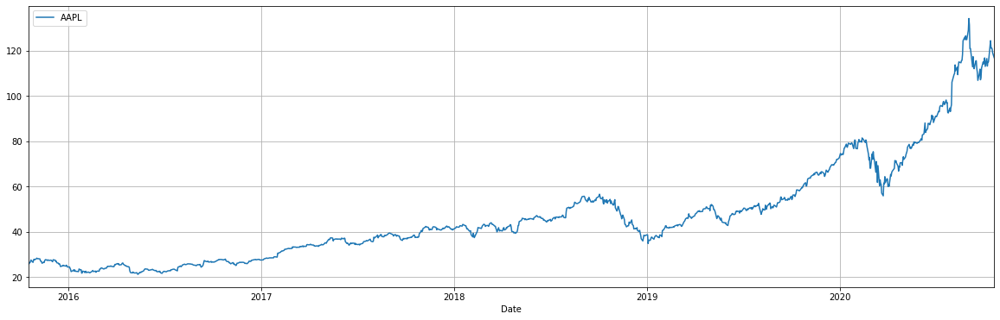

In [18]:
fig = plt.figure(figsize = (20,6))
plt.plot(apple, label = 'AAPL')
plt.xlabel('Date')
plt.legend(loc ='best')
plt.grid(True)
plt.autoscale(axis = 'x', tight =True)

Now let's take calculate first differences of the serie and returns and check stationary again.

In [11]:
d_apple = apple.diff()[1:]
d_apple.name = 'AAPL first differences'
check_for_stationarity(d_apple)

p-value = 0.0 The series AAPL first differences is likely stationary.


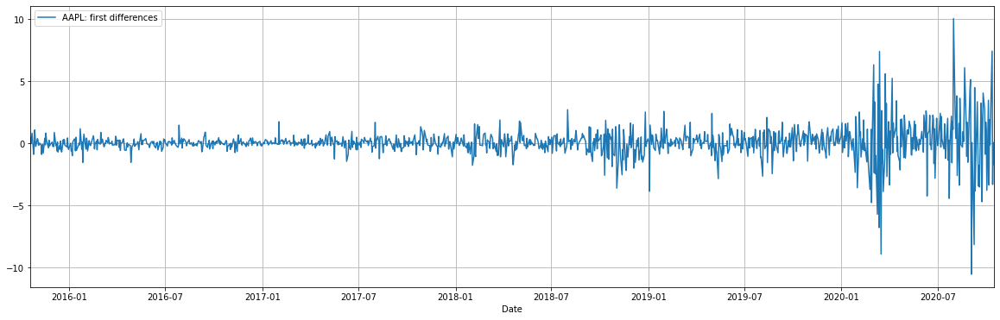

In [51]:
fig = plt.figure(figsize = (20,6))
plt.plot(d_apple, label = 'AAPL: first differences')
plt.xlabel('Date')
plt.legend(loc ='best')
plt.grid(True)
plt.autoscale(axis = 'x', tight =True)

In [13]:
rets_apple = apple.pct_change()[1:]
rets_apple.name = 'AAPL returns'
check_for_stationarity(rets_apple)

p-value = 0.0 The series AAPL returns is likely stationary.


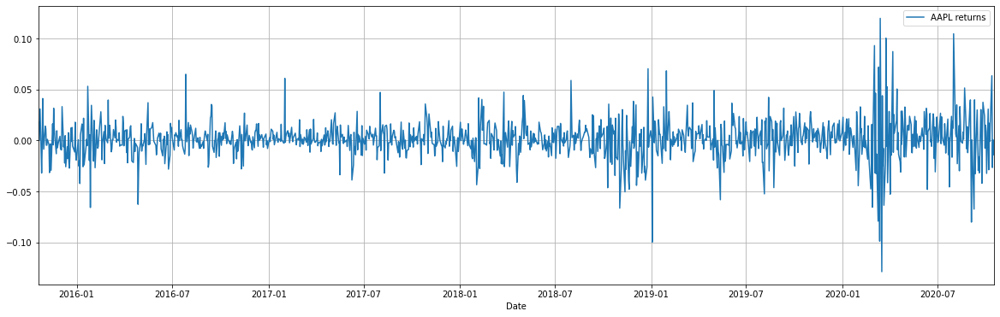

In [52]:
fig = plt.figure(figsize = (20,6))
plt.plot(rets_apple, label = 'AAPL returns')
plt.xlabel('Date')
plt.legend(loc ='best')
plt.grid(True)
plt.autoscale(axis = 'x', tight =True)

***Note:*** The reason returns are usually used for modeling in quantitive finance is that they are far more stationary than prices. This makes them easier to model and returns forecasting more feasible.

## Cointegration

Finally, now that we've discussed stationarity and order of integration, we can discuss cointegration.


**Linear combination:** A linear combination of the time series ($X_1$, $X_2$, $\dots$, $X_k$) is a new time series $Y$ constructed as follows for any set of real numbers $b_1 \dots b_k$

$$Y=b_1X_1+b_2X_2+⋯+b_kX_k$$


**Cointegration:** For some set of time series ($X_1$, $X_2$, $\dots$, $X_k$), if all series are $I(1)$, and some linear combination of them is $I(0)$, we say the set of time series is cointegrated.

Cointegration is a more subtle relationship than correlation. If two time series are cointegrated, there is some linear combination between them that will vary around a mean. At all points in time, the combination between them is related to the same probability distribution.

If we find two cointegreted assets, $A_1, A_2$, this mean that the linear combination of their prices $B = b_1A_1 + b_2A_2$ is mean reverting and we can bet on $B$ and place trades accordingly.


### Simulated data example


In [19]:
N = 200

# Generate a stationary random X1
X1 = np.random.normal(0, 1, N)

# Integrate it to make it I(1)
X1 = np.cumsum(X1)
X1 = pd.Series(X1, name = 'X1')

# Define X2 that is a constant + X1 + some noise
noise = np.random.normal(0, 1, N)
const = 3
X2 = const + X1 + noise
X2.name ='X2'

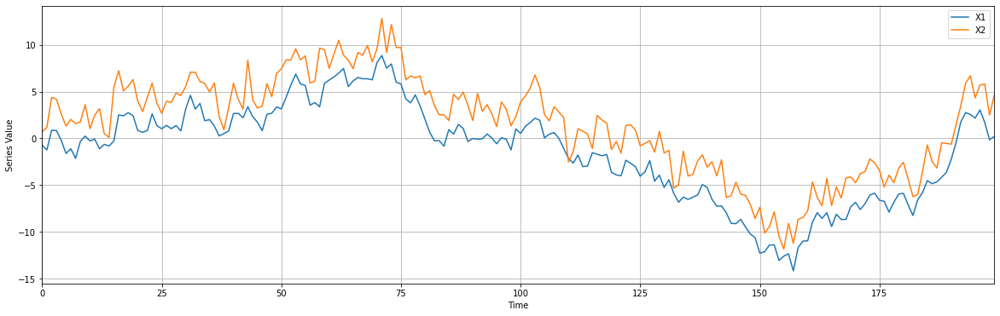

In [20]:
fig = plt.figure(figsize = (20,6))
plt.plot(X1, label = 'X1')
plt.plot(X2, label = 'X2')
plt.xlabel('Time')
plt.ylabel('Series Value')
plt.legend(loc = 'best')
plt.autoscale(axis = 'x', tight = True)
plt.grid(True);

In [21]:
check_for_stationarity(X1)
check_for_stationarity(X2)

p-value = 0.5796 The series X1 is likely non-stationary.
p-value = 0.5533 The series X2 is likely non-stationary.


Now to show cointegration we'll need to find some linear combination of $X_1$ and $X_2$ that is stationary. We can take $X_2-X_1$. All that's left over should be stationary noise by design. Let's check this.

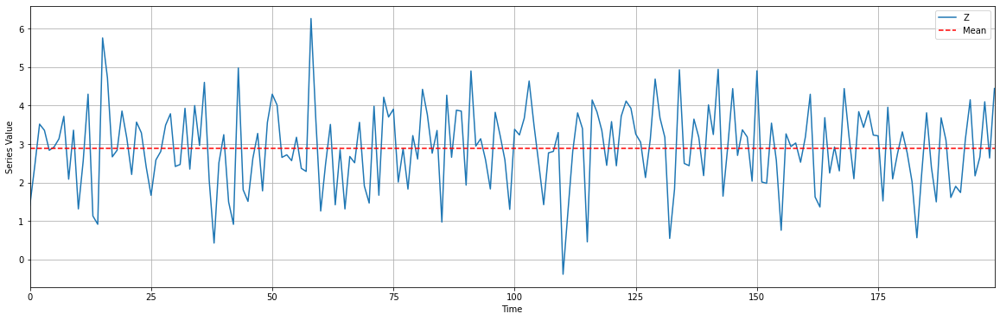

In [22]:
Z = X2 - X1
Z.name = 'Z'


fig = plt.figure(figsize = (20,6))
plt.plot(Z, label = 'Z')
plt.axhline(Z.mean(), color='red', linestyle='--', label = 'Mean')
plt.xlabel('Time')
plt.ylabel('Series Value')
plt.legend(loc = 'best')
plt.autoscale(axis = 'x', tight = True)
plt.grid(True);

In [23]:
check_for_stationarity(Z)

p-value = 0.0 The series Z is likely stationary.


### Testing for Cointegration

There are a bunch of ways to test for cointegration. In general we're just trying to solve for the coefficients $b_1, \dots b_k$ that will produce an $I(0)$ linear combination. If our best guess for these coefficients does not pass a stationarity check, then we reject the hypothesis that the set is cointegrated. This will lead to risk of Type II errors (false negatives), as we will not exhaustively test for stationarity on all coefficent combinations. However Type II errors are generally okay here, as they are safe and do not lead to us making any wrong forecasts.

In practice a common way to do this for pairs of time series is to use linear regression to estimate $\beta$ in the following model.
$$X_2=\alpha+\beta X_1+\epsilon$$

The idea is that if the two are cointegrated we can remove $X_2$'s depedency on $X_1$, leaving behind stationary noise. The combination $X_2 - \beta X_1 = \alpha + \epsilon$ should be stationary.

There is a convenient cointegration test that lives in **statsmodels.tsa.stattools**. Let's say that our confidence level is 0.05. We should see a p-value below our cutoff, as we've artifically created two series that are the textbook definition of cointegration.

In [24]:
score, pvalue, _ = coint(X1,X2)
print(pvalue)

9.428027406329355e-07


### Correlation vs. Cointegration

Correlation and cointegration, while theoretically similar, are not the same. To demonstrate this, we'll show examples of series that are correlated, but not cointegrated, and vice versa. To start let's check the correlation of the series we just generated.

In [25]:
X1.corr(X2)

0.9790042046425602

That's very high, as we would expect. But how would two series that are correlated but not cointegrated look?

### Correlation without cointegration

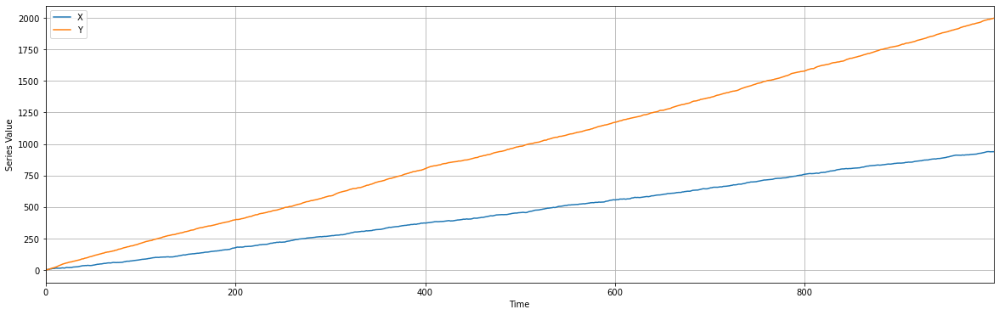

In [26]:
X_returns = np.random.normal(1, 1, 1000)
Y_returns = np.random.normal(2, 1, 1000)

X_diverging = pd.Series(np.cumsum(X_returns), name='X')
Y_diverging = pd.Series(np.cumsum(Y_returns), name='Y')

fig = plt.figure(figsize = (20,6))
plt.plot(X_diverging, label = 'X')
plt.plot(Y_diverging, label = 'Y')
plt.xlabel('Time')
plt.ylabel('Series Value')
plt.legend(loc = 'best')
plt.autoscale(axis = 'x', tight = True)
plt.grid(True)

In [27]:
print ('Correlation: ' + str(X_diverging.corr(Y_diverging)))
score, pvalue, _ = coint(X_diverging,Y_diverging)
print ('Cointegration test p-value: ' + str(pvalue))

Correlation: 0.9997716502575087
Cointegration test p-value: 0.0663993852610892


### Cointegration without correlation

A simple example of this case is a normally distributed series and a square wave.

In [28]:
N = 1000
Y1 = pd.Series(np.random.normal(0, 1, N), name='Y1') + 20
Y2 = Y1.copy()

Y2[0:100] = 30
Y2[100:200] = 10
Y2[200:300] = 30
Y2[300:400] = 10
Y2[400:500] = 30
Y2[500:600] = 10
Y2[600:700] = 30
Y2[700:800] = 10
Y2[800:900] = 30
Y2[900:1000] = 10

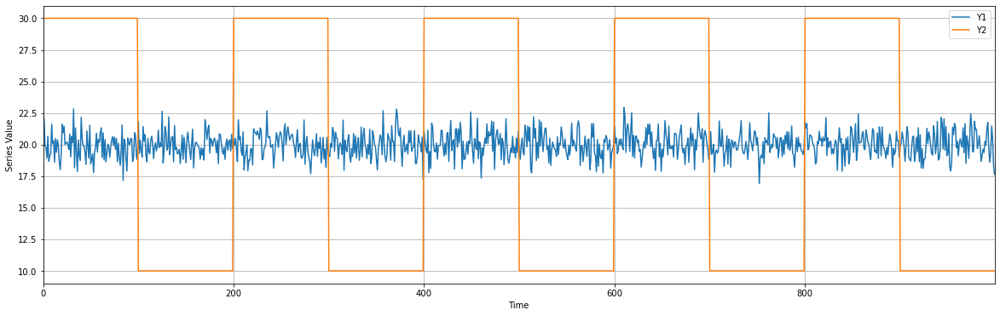

In [29]:
fig = plt.figure(figsize = (20,6))
plt.plot(Y1, label = 'Y1')
plt.plot(Y2, label = 'Y2')
plt.xlabel('Time')
plt.ylabel('Series Value')
plt.legend(loc = 'best')
plt.autoscale(axis = 'x', tight = True)
plt.grid(True)

In [30]:
print('Correlation: ' + str(Y1.corr(Y2)))
score, pvalue, _ = coint(Y1,Y2)
print('Cointegration test p-value: ' + str(pvalue))

Correlation: 0.027184165198393992
Cointegration test p-value: 0.0


### Hedging

Because a short sale makes money if the security sold loses value, and a long purchase will make money if a security gains value, one can long parts of the market and short others. That way if the entire market falls off a cliff, we'll still make money on the shorted securities and hopefully break even. In the case of two securities we'll call it a hedged position when we are long on one security and short on the other.

### The Trick: Where it all comes together

Because the securities drift towards and apart from each other, there will be times when the distance is high and times when the distance is low. The trick of pairs trading comes from maintaining a hedged position across X and Y. If both securities go down, we neither make nor lose money, and likewise if both go up. We make money on the spread of the two reverting to the mean. In order to do this we'll watch for when X and Y are far apart, then short Y and long X. Similarly we'll watch for when they're close together, and long Y and short X.


#### Going Long the Spread
This is when the spread is small and we expect it to become larger. We place a bet on this by longing Y and shorting X.

#### Going Short the Spread
This is when the spread is large and we expect it to become smaller. We place a bet on this by shorting Y and longing X.


#### Specific Bets

One important concept here is that we are placing a bet on one specific thing, and trying to reduce our bet's dependency on other factors such as the market.


### Finding real securities that behave like this

The best way to do this is to start with securities you suspect may be cointegrated and perform a statistical test. If you just run statistical tests over all pairs, you'll fall prey to multiple comparison bias.

Here's a method to look through a list of securities and test for cointegration between all pairs. It returns a cointegration test score matrix, a p-value matrix, and any pairs for which the p-value was less than 0.05

The methods for finding viable pairs all live on a spectrum. At one end of the spectrum there is the formation of an economic hypothesis for an individual pair. You have some extra knowledge about an economic link that leads you to believe that the pair is cointegrated, so you go out and test for the presence of cointegration. In this case you will incur no multiple comparisons bias. At the other end, you perform a search through hundreds of different securities for any viable pairs according to your test. In this case you will incur a very large amount of multiple comparisons bias.

Multiple comparisons bias is the increased chance to incorrectly generate a significant p-value when many tests are run. If 100 tests are run on random data, we should expect to see 5 p-values below 0.05 on expectation. Because we will perform $n(n−1)/2$ comparisons, we should expect to see many incorrectly significant p-values. For the sake of this example we will ignore this and continue. In practice a second verification step would be needed if looking for pairs this way. 

Another approach is to pick a small number of pairs you have reason to suspect might be cointegrated and test each individually. This will result in less exposure to multiple comparisons bias. 

In [31]:
def find_cointegrated_pairs(data):
    n = data.shape[1]
    score_matrix = np.zeros((n, n))
    pvalue_matrix = np.ones((n, n))
    keys = data.keys()
    pairs = []
    for i in range(n):
        for j in range(i+1, n):
            S1 = data[keys[i]]
            S2 = data[keys[j]]
            result = coint(S1, S2)
            score = result[0]
            pvalue = result[1]
            score_matrix[i, j] = score
            pvalue_matrix[i, j] = pvalue
            if pvalue < 0.05:
                pairs.append((keys[i], keys[j]))
    return score_matrix, pvalue_matrix, pairs

### Looking for Cointegrated Pairs

We are looking through a set of tech companies to see if any of them are cointegrated. We'll start by defining the list of securities we want to look through. Then we'll get the pricing data for each security from the year 2018 - 2020.

As mentioned before, we have formulated an economic hypothesis that there is some sort of link between a subset of securities within the tech sector, and we want to test whether there are any cointegrated pairs. This incurs significantly less multiple comparisons bias than searching through hundreds of securities and slightly more than forming a hypothesis for an individual test.

We have decided to analyze the following technology stocks: 'GGAL', 'PAM', 'YPF', 'LOMA', 'SUPV', 'BMA'.

We've also decided to include the S&P 500 in our analysis. This is because the market drives the movement of so many securities that you often times might find two seemingingly cointegrated securities, but in reality they are not cointegrated and just both conintegrated with the market. This is known as a confounding variable and it is important to check for market involvement in any relationship you find.

After extracting the historical prices, we will create a heatmap that will show the p-values of the cointegrated test between each pair of stocks. The heatmap will mask all pairs with a p-value greater than 0.05.

In [157]:
tickers = ['GGAL', 'PAM', 'YPF', 'LOMA', 'SUPV', 'BMA']
data = pd.DataFrame(columns = tickers)

for ticker in tickers:
    data[ticker] = yf.download(ticker, period='5y')['Adj Close']
    
data.dropna(inplace=True)

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


In [158]:
scores, pvalues, pairs = find_cointegrated_pairs(data)

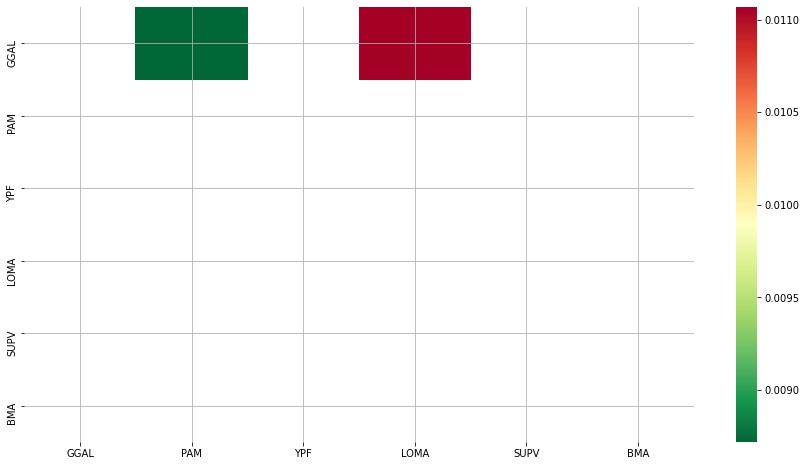

In [159]:
fig = plt.figure(figsize = (15,8))
sns.heatmap(pvalues, xticklabels=tickers, yticklabels=tickers, cmap='RdYlGn_r', mask = (pvalues > 0.05))
plt.grid(True)

It seems that PAMP and GGAL are cointegrated.

In [337]:
check_for_stationarity(data['PAM'])
check_for_stationarity(data['GGAL'])

score, pvalue, _ = coint(data['PAM'],data['GGAL'])
print('Cointegration test p-value: ' + str(pvalue))

p-value = 0.363 The series PAM is likely non-stationary.
p-value = 0.7221 The series GGAL is likely non-stationary.
Cointegration test p-value: 0.004463865025958281


### Calculating the Spread

Now we will plot the spread of the two series. In order to actually calculate the spread, we use a linear regression to get the coefficient for the linear combination to construct between our two securities. Using a linear regression to estimate the coefficient is known as the Engle-Granger method.

In [338]:
PAMP, GGAL = data['PAM'], data['GGAL']

results = sm.OLS(PAMP, GGAL).fit()
b = results.params['GGAL']

spread = PAMP - b * GGAL

In [345]:
check_for_stationarity(pd.Series(spread, name = 'spread'))

p-value = 0.0035 The series spread is likely stationary.


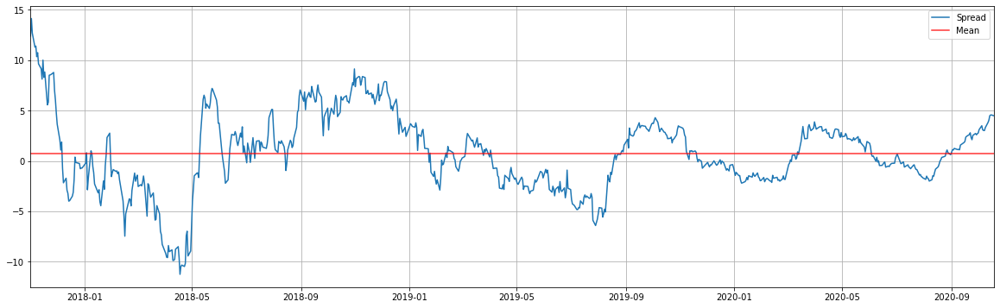

In [225]:
fig = plt.figure(figsize = (20,6))
plt.plot(spread, label = 'Spread')
plt.axhline(spread.mean(), color='red', label = 'Mean', alpha = .8)
plt.legend(loc='best')
plt.grid(True)
plt.autoscale(axis = 'x', tight = True)

The absolute spread isn't very useful in statistical terms. It is more helpful to normalize our signal by treating it as a z-score.


**WARNING**

In practice this is usually done to try to give some scale to the data, but this assumes some underlying distribution, usually a normal distribution. Under a normal distribution, we would know that approximately 84% of all spread values will be smaller. However, much financial data is not normally distributed, and one must be very careful not to assume normality, nor any specific distribution when generating statistics. It could be the case that the true distribution of spreads was very fat-tailed and prone to extreme values. This could mess up our model and result in large losses.


In [250]:
def zscore(series):
    zs = (series - np.mean(series))/np.std(series)

    return zs

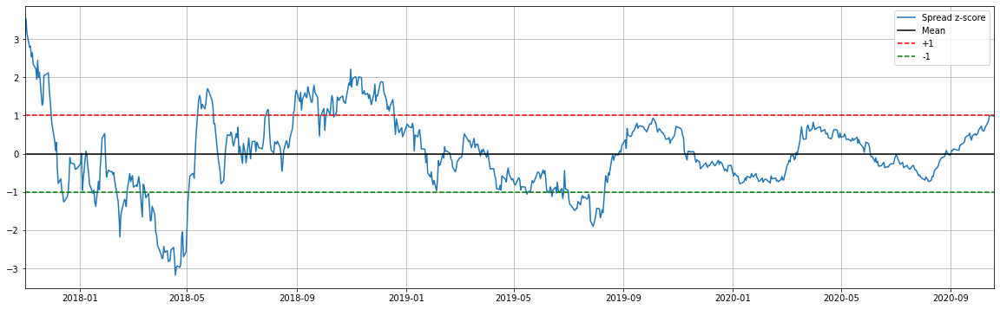

In [251]:
spread_zsc= zscore(spread)

fig = plt.figure(figsize = (20,6))
plt.plot(spread_zsc, label = 'Spread z-score')
plt.axhline(np.mean(spread_zsc), color='black', label = 'Mean')
plt.axhline(1.0, color='red', linestyle='--', label = '+1')
plt.axhline(-1.0, color='green', linestyle='--', label = '-1')
plt.legend(loc='best')
plt.grid(True)
plt.autoscale(axis = 'x', tight = True)

### Simple Strategy:

- Go "Long" the spread whenever the z-score is below -1.0
- Go "Short" the spread when the z-score is above 1.0
- Exit positions when the z-score approaches zero

This is just the top of the iceberg, and only a very simplistic example to illustrate the concepts. In practice you would want to compute a more optimal weighting for how many shares to hold for each stock. 

## LOMA vs HARG

In [267]:
tickers = ['LOMA.BA', 'HARG.BA']
data = pd.DataFrame(columns = tickers)

for ticker in tickers:
    data[ticker] = yf.download(ticker, period='5y')['Adj Close']
    
data.dropna(inplace =True)    

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


In [268]:
check_for_stationarity(data['LOMA.BA'])
check_for_stationarity(data['HARG.BA'])

score, pvalue, _ = coint(data['LOMA.BA'],data['HARG.BA'])
print('Cointegration test p-value: ' + str(pvalue))

p-value = 0.8324 The series LOMA.BA is likely non-stationary.
p-value = 0.0 The series HARG.BA is likely stationary.
Cointegration test p-value: 0.9060834547189869


## Autocorrelation and AR Models

Autocorrelation is one of the most common effects in financial time series. It describes the phenomena of future values being dependent on current and past values as well as new information. Autocorrelation also leads to fat tails and tail risk, which can sink your algorithm if you assume underlying distributions are not autoregressive. Because there is so much autocorrelation in finance we should understand how to effectively model it.
 
### AR Models
An autoregressive, or $AR(p)$, model is created by regressing a time series on its past values, its lags. The simplest form of an autoregressive model is an $AR(1)$ model, signifying using only one lag term. A first order autocorrelation model like this for a time series $y_t$ is:

$$
y_t = b_0 + b_1 y_{t - 1} + \epsilon_t
$$

Where $y_{t - 1}$ represents the value of the time series at time $(t - 1)$ and $\epsilon_t$ is the error term. We can extend this to an $AR(p)$ model, denoted:

$$
y_t = b_0 + b_1 y_{t-1} + b_2 y_{t - 2} \ldots + b_p y_{t - p} + \epsilon_t
$$

For an $AR$ model to function properly, we must require that the time series is covariance stationary. This means that it follows three conditions:

1. The expected value of the time series is constant and finite at all times, i.e. $E(y_t) = \mu$ and $|\mu| < \infty$ for all values of $t$.
2. The variance of the time series is constant and finite for all time periods, i.e. $V(y_t) = \sigma^2$ and $\sigma^2  < \infty$ for all values of $t$.
3. The covariance of the time series with itself for a fixed number of periods in either the future or the past is constant and finite for all time periods, i.e

$$
COV(y_t, y_{t - s}) = \lambda, \  |\lambda| < \infty, \text{ $\lambda$ constant}, \  t = 1, 2, \ \ldots, T; \  s = 0, \pm 1, \pm 2, \ldots, \pm T
$$

Note that this mathematical representation includes condition 2.

If these conditions are not satisfied, our estimation results will not have real-world meaning. Our estimates for the parameters will be biased, making any tests that we try to form using the model invalid. Unfortunately, it can be a real pain to find a covariance-stationary time series in the wild in financial markets. 


### Simulating Data

Here we will draw data samples from a simulated $AR(3)$ process.

In [52]:
def AR(b, X, mu, sigma):
    l = min(len(b)-1, len(X))
    b0 = b[0]
    
    return b0 + np.dot(b[1:l+1], X[-l:]) + np.random.normal(mu, sigma)

b = np.array([0, 0.8, 0.1, 0.05])
X = np.array([1])

mu = 0
sigma = 1

for i in range(1000):
    X = np.append(X, AR(b, X, mu, sigma))
    
X = pd.Series(X, name = 'X')

Text(0, 0.5, 'AR Series Value')

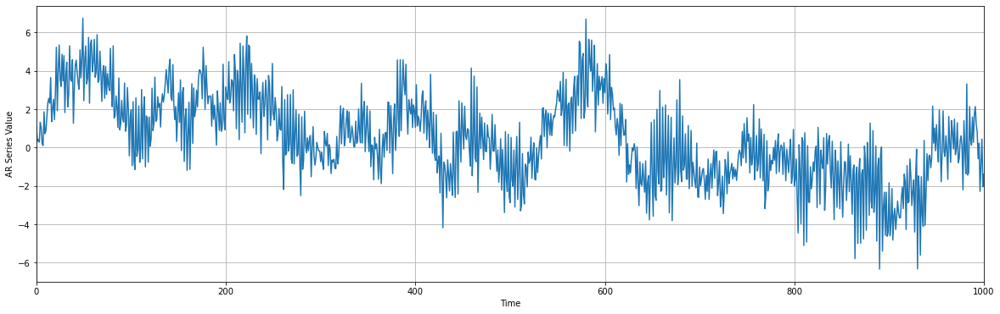

In [53]:
fig = plt.figure(figsize = (20,6))
plt.plot(X)
plt.grid(True)
plt.autoscale(axis = 'x', tight = True)
plt.xlabel('Time')
plt.ylabel('AR Series Value')

Note how this process fluctuates around some central value. This value is the mean of our time series.

In [54]:
check_for_stationarity(X)

p-value = 0.0294 The series X is likely non-stationary.


### Tail Risk

Autoregressive processes will tend to have more extreme values than data drawn from, for example, a normal distribution. This is because the value at each time point is influenced by recent values. If the series randomly jumps up, it is more likely to stay up than a non-autoregressive series. This is known as 'fat-tailledness' (fat-tailed distribution) because the extremes on the pdf will be fatter than in a normal distribution.

Much talk of tail risk in finance comes from the fact that tail events do occur and are hard to model due to their infrequent occurrence. If we have reason to suspect that a process is autoregressive, we should expect risk from extreme tail events and adjust accordingly.

AR models are just one of the sources of tail risk, so don't assume that because a series is non-AR it does not have tail risk.

Let's now check for that behavior.

In [55]:
Y = np.random.normal(0,1, 1000)

Text(0.5, 0, 'Value')

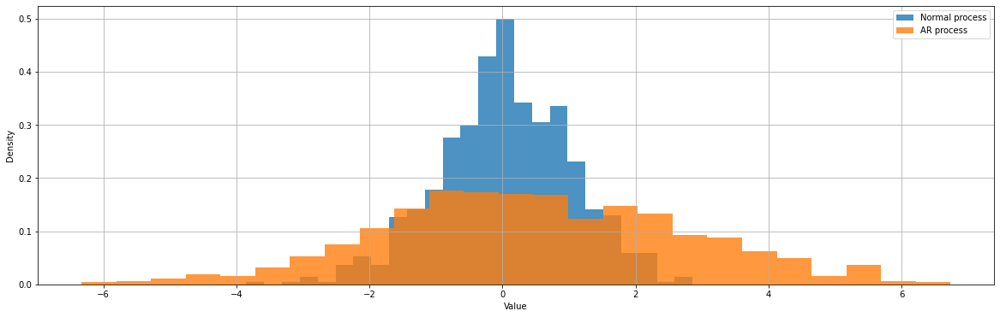

In [56]:
fig = plt.figure(figsize = (20,6))
plt.hist(Y, bins= 25, alpha = 0.8, density = True, label = 'Normal process')
plt.hist(X, bins = 25, alpha=0.8, density = True, label = 'AR process')
plt.grid(True)
plt.legend(loc = 'best')
plt.ylabel('Density')
plt.xlabel('Value')

**Estimations of variance will be wrong**: Because an AR process has a tail heavy and non-normal distribution of outcomes, estimates of variance on AR processes will be wrong. This is dangerous because variance is used to calculate many quantities in staistics, most importantly confidence intervals and p-values. Because the width of the confidence interval is often based on a variance estimate, we can no longer trust p-values that come from AR processes.



### Testing for AR Behavior

In order to determine the order, $p$, of an $AR(p)$ model, we look at the autocorrelations of the time series. These are the correlations of the series with its past values. The $k$-th order autocorrelation is

$$
\rho_k = \frac{COV(y_t, y_{t - k})}{\sigma_y^2} = \dfrac{E[(y_t - \mu)(y_{t - k} - \mu)]}{\sigma_y^2}
$$

Where $k$ represents the number of periods lagged. We cannot directly observe the autocorrelations so we estimate them as: 

$$
\hat{\rho}_k = \frac{\sum_{t = k + 1}^T[(y_t - \bar{y})(y_{t - k} - \bar{y})]}{\sum_{t = 1}^T (y_t - \bar{y})^2}
$$

For our purposes, we can use a pair of tools called the autocorrelation function (ACF) and the partial autocorrelation function (PACF) in order to determine the order of our model. The PACF controls for shorter lags, unlike the ACF. These functions are included with many statistical packages and compute the sample autocorrelations for us, allowing us to determine the appropriate value of $p$.

We will demonstrate these functions on our above example of a stationary series:

In [57]:
from statsmodels.tsa.stattools import acf, pacf

def simululate_AR_process(b, T):
    X = np.array([1])

    mu = 0
    sigma = 1

    for i in range(T):
        X = np.append(X, AR(b, X, mu, sigma))
        
    return X

In [60]:
nlags = 40

X_acf = acf(X, nlags=nlags, fft=False)
print('Autocorrelations:\n' + str(X_acf) + '\n')
X_pacf = pacf(X, nlags=nlags)
print('Partial Autocorrelations:\n' + str(X_pacf))

Autocorrelations:
[1.         0.5879667  0.59810009 0.88228553 0.57397874 0.60061796
 0.79431104 0.55201734 0.5949422  0.72497134 0.53981202 0.57770629
 0.66398082 0.5363815  0.55625715 0.61292263 0.52086389 0.52793062
 0.56603304 0.50195958 0.49483037 0.53596927 0.48138033 0.4686117
 0.50453946 0.45651786 0.4533737  0.46710418 0.43248926 0.44484865
 0.43791487 0.40836593 0.41816136 0.41595244 0.3929935  0.38837549
 0.39202486 0.36865215 0.36428793 0.36010629 0.34863044]

Partial Autocorrelations:
[ 1.00000000e+00  5.88554664e-01  3.86933265e-01  7.93464149e-01
  6.61071682e-03  3.87902757e-02  2.90928723e-02 -3.40817006e-02
  1.96418012e-02  1.90960832e-02  3.30434636e-02 -1.76000491e-02
 -1.07287838e-02  5.62502980e-02 -1.27339070e-02 -5.22880028e-03
 -2.19514535e-02 -2.99929053e-02 -2.01518829e-02 -8.60679027e-04
 -2.48434808e-02  4.84210696e-02  2.85720852e-04  8.16521463e-03
 -9.88219700e-03 -1.78797440e-02  4.20325709e-02 -4.72962698e-02
  1.09669152e-03  5.27644850e-02  3.941926

Text(0.5, 1.0, 'ACF')

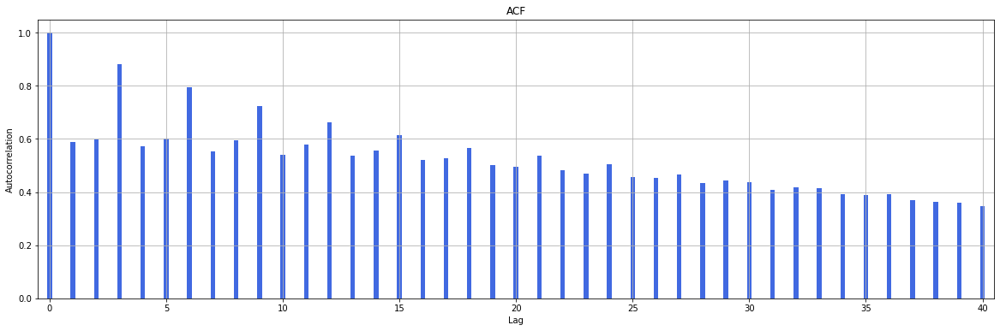

In [153]:
fig = plt.figure(figsize=(20,6))
for x,y in zip(range(nlags+1), X_acf):
    plt.bar(x, y, color = 'royalblue', width=0.2)
plt.grid(True)
plt.xlim(-0.5, 40.5)
plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.title("ACF")

Text(0.5, 1.0, 'PACF')

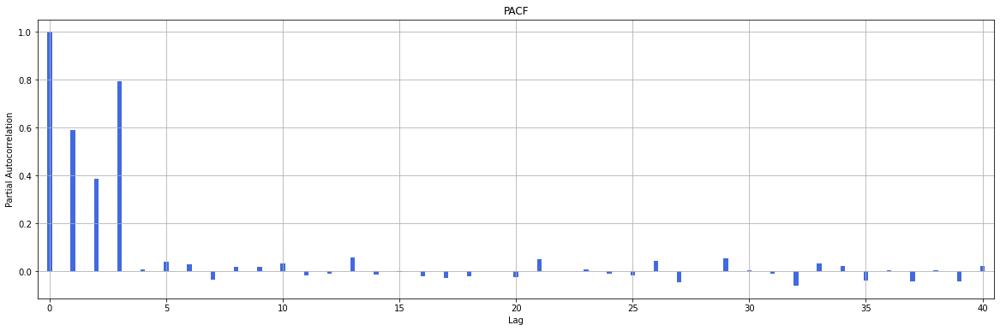

In [152]:
fig = plt.figure(figsize=(20,6))
for x,y in zip(range(nlags+1), X_pacf):
    plt.bar(x, y, color = 'royalblue', width=0.2)
plt.grid(True)
plt.xlim(-0.5, 40.5)
plt.xlabel('Lag')
plt.ylabel('Partial Autocorrelation')
plt.title("PACF")